# Fit a 2D model to the gradient using FRApy


In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

%matplotlib notebook
import matplotlib.pylab as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
sns.set(style='dark')

import numpy as np

from scipy.stats import binned_statistic

from astropy.io import fits
from astropy.wcs import WCS
from astropy import cosmology as co
import astropy.units as uu
from astropy.stats import median_absolute_deviation, sigma_clipped_stats
from astropy.convolution import convolve,Gaussian2DKernel,Moffat2DKernel
from reproject import reproject_interp

# Temporary work-around
import sys
frapy_path = '/Users/vera/Soft/MyPy/frapy/'
sys.path.append(frapy_path)
sys.path

# Import FRApy
from frapy import Observation,Metallicity_Gradient,fit_model,make_input_parameters,Output,Metallicity_Gradient_Constant_Centre

import warnings
warnings.filterwarnings('ignore')

cd = co.FlatLambdaCDM(H0=70*uu.km/(uu.megaparsec * uu.s), Om0=0.3, Tcmb0 = 2.725*uu.K,\
                          Neff=3.05, m_nu=[0., 0., 0.06]*uu.eV, Ob0 = 0.0483)

## Load data and model

In [2]:
obs = Observation(z=0.611,
                  data_path='Maps/Map_metallicity.fits',
                  unc_path='Maps/Map_metallicity_unc.fits',
                  seeing = 1.03/0.2)

model = Metallicity_Gradient(zlens=0.348,
                            dfx_path='../../Data/Lensing/AS1063/AS1063_dplx.fits',
                            dfy_path='../../Data/Lensing/AS1063/AS1063_dply.fits',
                            df_ang=90.)

model.create_projection_maps(obs,correct_z=False)

Model with Galfit


    COMMENT ========== GALFIT Final Parameters ==========
    COMP_1  = 'sersic  '           / Component type
    1_XC    = '243.8457 +/- 0.0215' / X center [pixel]
    1_YC    = '260.9165 +/- 0.0154' / Y center [pixel]
    1_MAG   = '21.2097 +/- 0.0100' / Integrated magnitude [mag]
    1_RE    = '3.5528 +/- 0.0381'  / Effective radius Re [pixels]
    1_N     = '[1.0000]'           / Sersic index
    1_AR    = '[0.7200]'           / Axis ratio (b/a)
    1_PA    = '[-27.2740]'         / Position Angle (PA) [degrees: Up=0, Left=90]
    COMMENT ------------------------------------------------------------------------
    COMP_2  = 'sersic  '           / Component type
    2_XC    = '218.0856 +/- 0.0299' / X center [pixel]
    2_YC    = '221.5096 +/- 0.0189' / Y center [pixel]
    2_MAG   = '21.5000 +/- 0.0076' / Integrated magnitude [mag]
    2_RE    = '2.9785 +/- 0.0293'  / Effective radius Re [pixels]
    2_N     = '1.0000 +/- 0.0367'  / Sersic index
    2_AR    = '[1.0000]'           / Axis ratio (b/a)
    2_PA    = '[0.000e+00]'        / Position Angle (PA) [degrees: Up=0, Left=90]
    COMMENT ------------------------------------------------------------------------
    COMP_3  = 'sersic  '           / Component type
    3_XC    = '246.5000 +/- 0.0193' / X center [pixel]
    3_YC    = '258.0100 +/- 0.0279' / Y center [pixel]
    3_MAG   = '17.7449 +/- 0.0034' / Integrated magnitude [mag]
    3_RE    = '44.3385 +/- 0.1446' / Effective radius Re [pixels]
    3_N     = '1.0000 +/- 0.0045'  / Sersic index
    3_AR    = '0.5572 +/- 0.0009'  / Axis ratio (b/a)
    3_PA    = '-31.7902 +/- 0.1083' / Position Angle (PA) [degrees: Up=0, Left=90]
    COMMENT ------------------------------------------------------------------------
    VERSION = 'galfitm-1.2.0'      / galfitm version
    CHISQ   =     2190313.22762707 / Chi^2 of fit
    NDOF    =                58796 / Degrees of freedom
    NFREE   =                   19 / Number of free parameters
    NFIX    =                    5 / Number of fixed parameters
    CHI2NU  =     37.2527591609475 / Reduced Chi^2
    LOGFILE = 'galaxy_gf1.galfit.08' / Output logfile
    COMMENT =============================================


**The disc is component 3 (it has the larger effective radius). It's in extension 5**

<IPython.core.display.Javascript object>


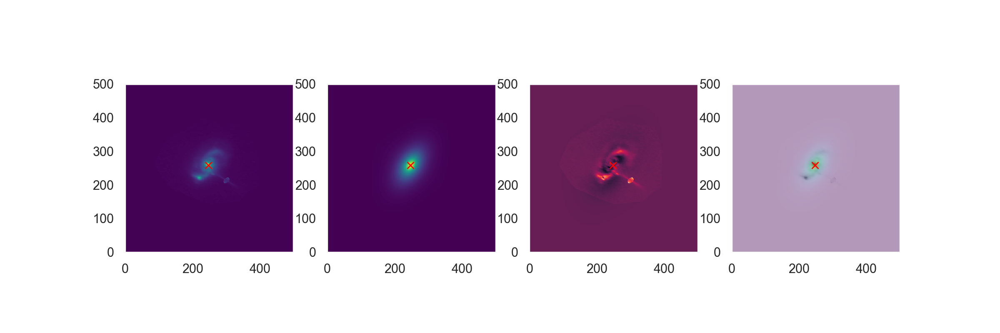

(array([258]), array([247]))


In [3]:
galfit_input = fits.getdata('../../Data/Galfit/as1063_gf1.fits',ext=0)
galfit_model = fits.getdata('../../Data/Galfit/as1063_gf1.fits',ext=5)
galfit_res = fits.getdata('../../Data/Galfit/as1063_gf1.fits',ext=2)

fig, ax = plt.subplots(1,4,figsize=(12,4))
ax[0].imshow(galfit_input,origin='lower',cmap='viridis')
ax[1].imshow(galfit_model,origin='lower',cmap='viridis')
ax[2].imshow(galfit_res,origin='lower')

ax[3].imshow(galfit_input,origin='lower',cmap='Greys')
ax[3].imshow(galfit_model,origin='lower',cmap='viridis',alpha=0.4)

print(np.where(galfit_model==np.max(galfit_model)))
for x in ax:
    x.plot(247,258,marker='x',color='red')


fits.writeto('../../Data/Lensing/AS1063/SP_GALFIT_model.fits',data=galfit_model,header=fits.getheader('../../Data/Lensing/AS1063/SP_HST/SP_AS1063_F814w_bigger.fits'),overwrite=True)

Put it back in image plane to get the centre

(using ../../Data/Lensing/AS1063/AS1063_simul.par)

<IPython.core.display.Javascript object>


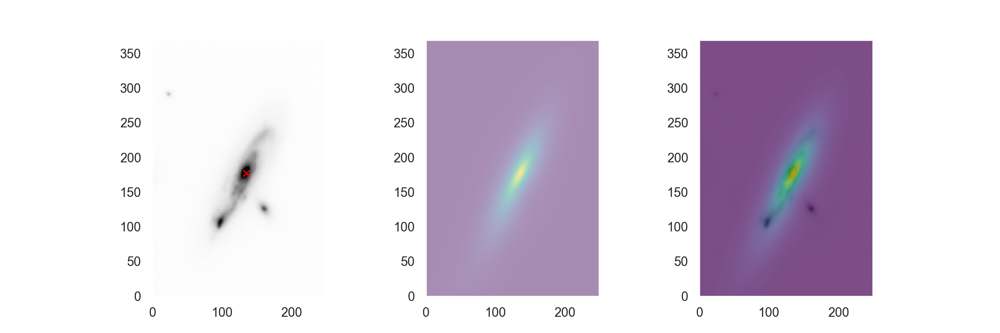

In [4]:
hst_ip = fits.getdata('../../Data/HST/AS1063_F160w.fits')
galfit_model, _ = reproject_interp('../../Data/Lensing/AS1063/simul_GALFIT_model.fits',fits.getheader('../../Data/HST/AS1063_F160w.fits'))

fig, ax = plt.subplots(1,3,figsize=(12,4))
ax[0].imshow(hst_ip,origin='lower',cmap='Greys',vmax=0.5)
ax[1].imshow(galfit_model,origin='lower',alpha=0.4,cmap='viridis')
ax[2].imshow(hst_ip,origin='lower',cmap='Greys',vmax=0.5)
ax[2].imshow(galfit_model,origin='lower',alpha=0.7,cmap='viridis')

np.where(galfit_model==np.max(galfit_model))
ax[0].plot(135,177,marker='x',color='red')

(array([22]), array([28]))
cx: 28
cy: 22
q: 0.55
pa: -32.00
df_ang: 90.00
z_grad: -0.0200
z_0: 9.0000


<IPython.core.display.Javascript object>


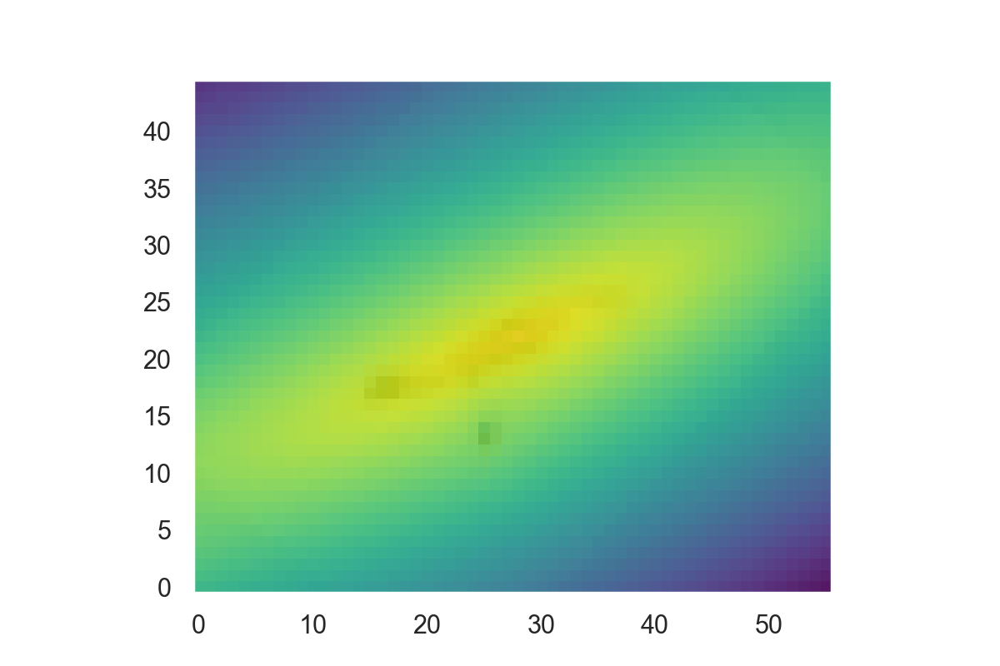

In [5]:
hst, _ = reproject_interp('../../Data/HST/AS1063_F160w.fits',obs.header)
galfit_model, _ = reproject_interp('../../Data/Lensing/AS1063/simul_GALFIT_model.fits',obs.header)
print(np.where(galfit_model==np.nanmax(galfit_model)))

model.cx = 28
model.cy = 22
model.q = 0.55 
model.z_grad = -0.02
model.z_0 = 9.0
model.pa = -32. 
model.print_parameter_values()

more_sensible_model = model.make_model()
fits.writeto('/Users/vera/Desktop/test2.fits',more_sensible_model,obs.header,overwrite=True)
fig, ax = plt.subplots(1,1,figsize=(6,4))
ax.imshow(hst,origin='lower',cmap='Greys',vmax=0.3)
ax.imshow(more_sensible_model,origin='lower',alpha=0.9,cmap='viridis')

### Model with morphology parameters fixed to what was found with galfit

In [5]:
model.cx = 28
model.cy = 23
model.q = 0.557 # min 0.6, max = 1
model.pa = -32 # min -60  max 40
input_par = make_input_parameters(name   = ('z_grad', 'z_0'),
                                 value   = (-0.02, 9.0),
                                 minimum = (-0.1, 8.5),
                                 maximum = (0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_morph_fixed',
               nsteps=1500,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits')

Using 24 walkers and fitting dict_keys(['z_grad', 'z_0']):
MCMCing for 1500 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 10.1664 minutes


Inspect the results

<IPython.core.display.Javascript object>


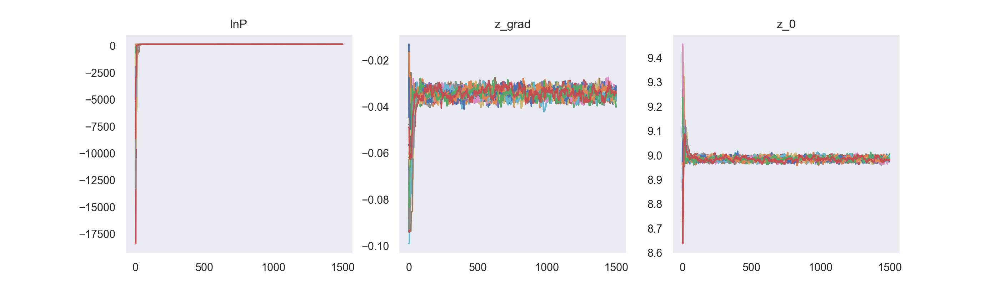

<IPython.core.display.Javascript object>


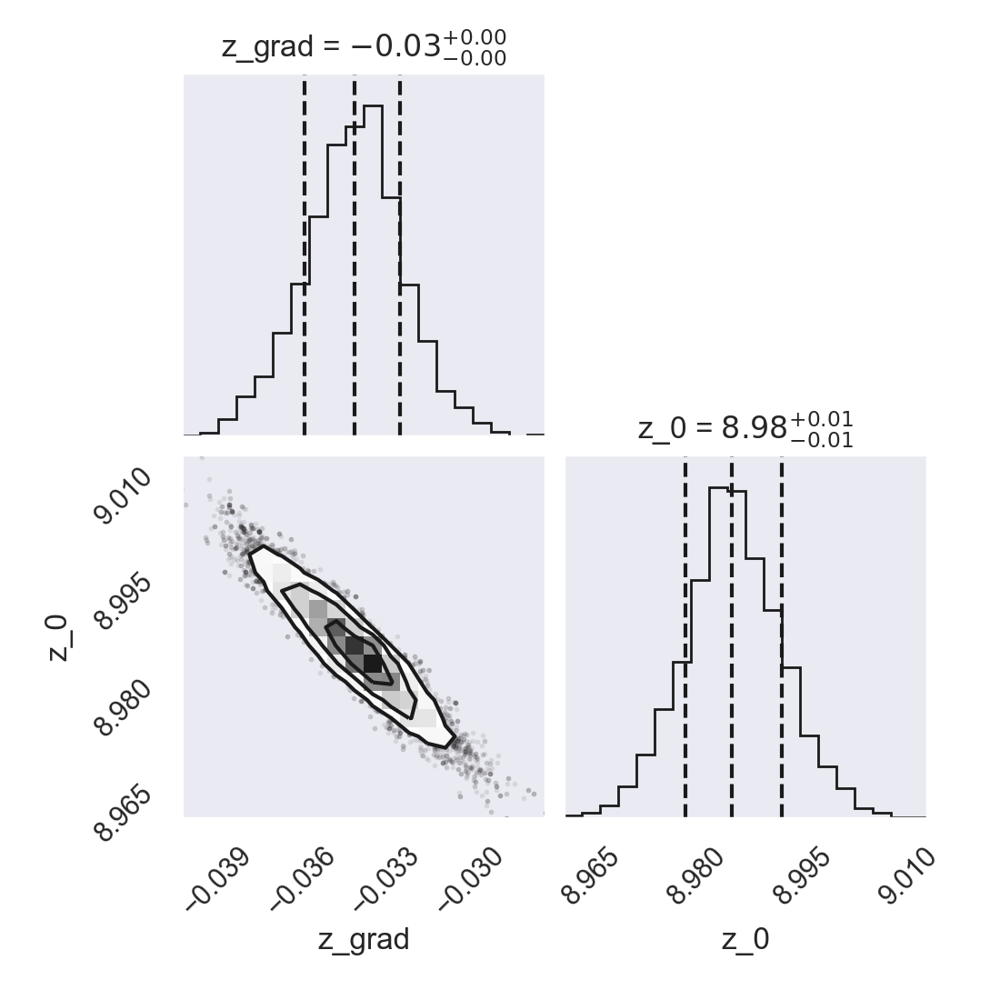

z_grad -0.0341$^{+0.0016}_{-0.0018}$
z_0 8.9850$^{+0.0070}_{-0.0066}$


<IPython.core.display.Javascript object>


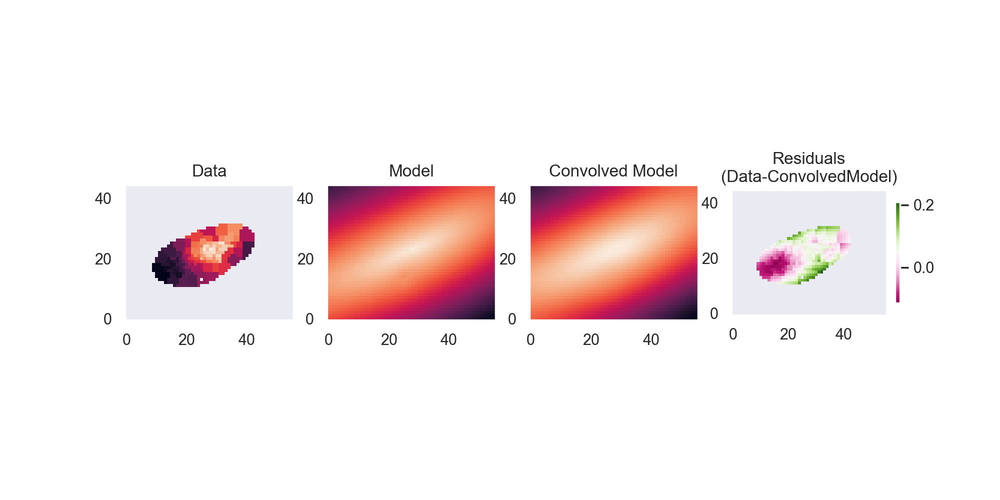

Chi2: 765.68
Chi2/dof: 5.76
Loglikelihood: 162
BIC: -315
Chi2: 2891.26
Chi2/dof: 6.04


In [7]:
results_fixed_morph = Output('as1063_image_plane_morph_fixed')
results_fixed_morph.check_convergence()
results_fixed_morph.make_cornerplot(start=1000)

best_param_fixed_morph = results_fixed_morph.best_parameters(start=1000)
best_model_fixed_morph, residuals_fixed_morph = results_fixed_morph.plot_solution(best_param_fixed_morph)
chi2_dof = results_fixed_morph.goodness_of_fit(best_param_fixed_morph)

## Write down the residuals map
#fits.writeto('Maps/Map_residuals_fixed_morphology.fits',data=residuals_fixed_morph,header=obs.header)

## Real chi2
free_par = 2
chi2_image = (residuals_fixed_morph)**2/obs.unc**2
chi2 = np.nansum(chi2_image[np.where(np.isfinite(chi2_image))])
print('Chi2: %0.2f'%chi2)
print('Chi2/dof: %0.2f'%(chi2/(len(np.where(np.isfinite(obs.data))[0])-free_par)))

Convert pixels to skycoordinates

In [8]:
from astropy.wcs import WCS
from astropy import units as u
from astropy.coordinates import SkyCoord

wcs = WCS('Maps/Map_metallicity.fits')

def to_hsm(x,y):
    ra,dec = wcs.all_pix2world(x,y,1)
    c = SkyCoord(ra=ra*u.degree, dec=dec*u.degree)
    print(c.to_string('hmsdms'))

to_hsm(28,22)
to_hsm(28,23)

print('Galfit centre',wcs.all_world2pix(342.17857919,-44.53251288,1))

22h48m41.7536s -44d31m56.5798s
22h48m41.7659s -44d31m56.4288s
Galfit centre [array(-18.1331731), array(59.01161052)]


### Model with all parameters free

In [67]:
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'pa', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,   20,    -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -90,     -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   90,      0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane',
               nsteps=4000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits')

Using 24 walkers and fitting dict_keys(['cx', 'cy', 'q', 'pa', 'z_grad', 'z_0']):
MCMCing for 4000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 25.7273 minutes


<IPython.core.display.Javascript object>


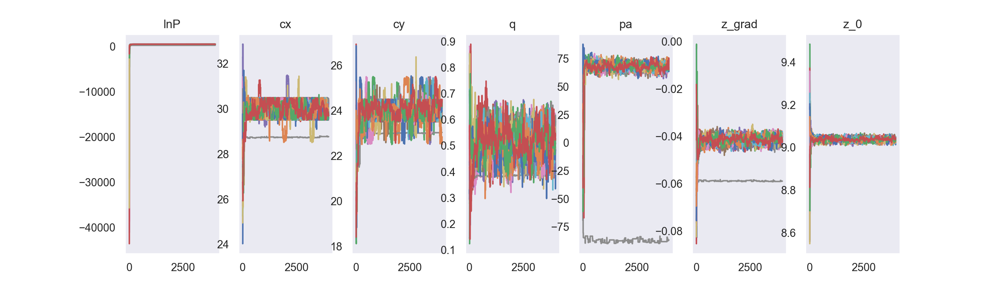

<IPython.core.display.Javascript object>


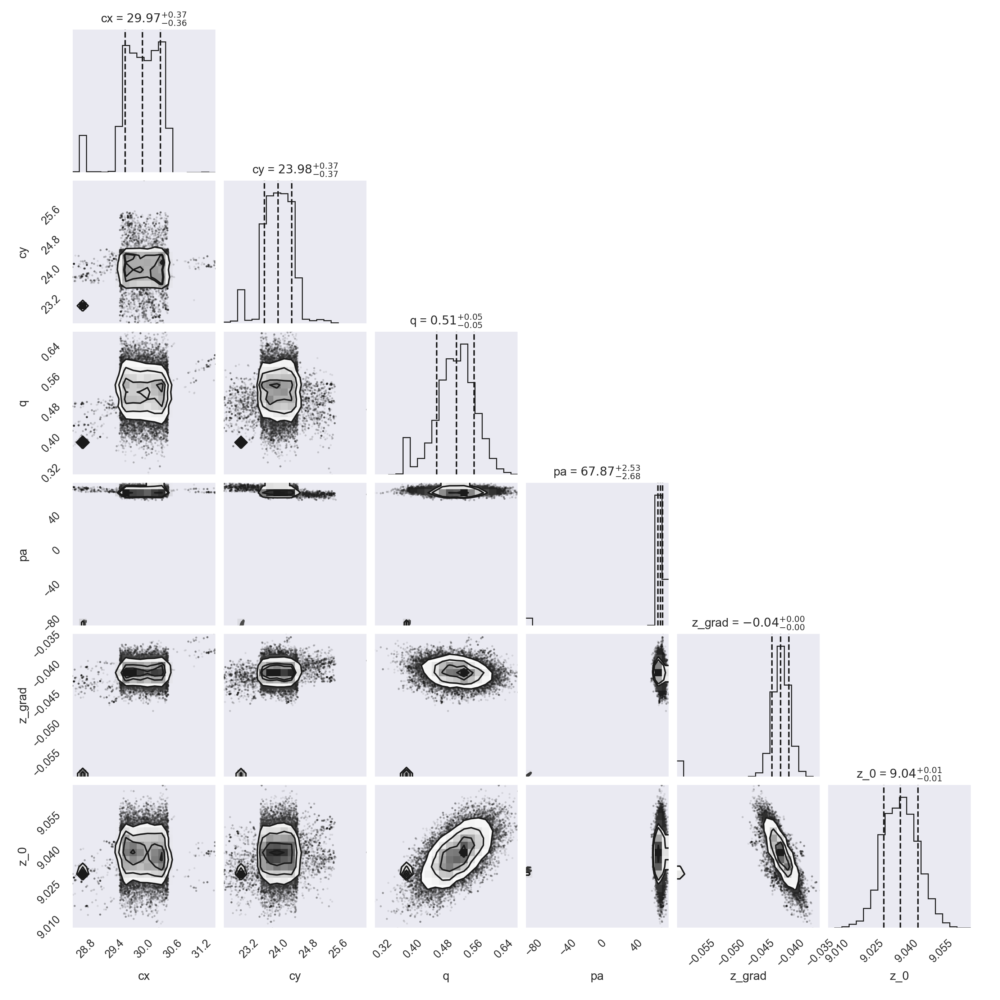

In [9]:
results = Output('as1063_image_plane')
results.check_convergence()
results.make_cornerplot(start=1000)

In [10]:
best_param = results.best_parameters(start=1000)
best_model, residuals = results.plot_solution(best_param)
chi2_dof = results.goodness_of_fit(best_param)

# Save residuals map
fits.writeto('Maps/Map_residuals_free_param.fits',data=residuals,header=obs.header)

## Real chi2
free_par = 6
chi2_image = (residuals)**2/obs.unc**2
chi2 = np.nansum(chi2_image[np.where(np.isfinite(chi2_image))])
print('Chi2: %0.2f'%chi2)
print('Chi2/dof: %0.2f'%(chi2/(len(np.where(np.isfinite(obs.data))[0])-free_par)))

cx 29.9745$^{+0.3666}_{-0.3601}$
cy 23.9830$^{+0.3659}_{-0.3733}$
q 0.5148$^{+0.0466}_{-0.0520}$
pa 67.8654$^{+2.5341}_{-2.6833}$
z_grad -0.0416$^{+0.0014}_{-0.0014}$
z_0 9.0373$^{+0.0077}_{-0.0071}$


<IPython.core.display.Javascript object>

Chi2: 104.28
Chi2/dof: 0.81
Loglikelihood: 493
BIC: -957


OSError: File 'Maps/Map_residuals_free_param.fits' already exists.

cx 29.9745$^{+0.3666}_{-0.3601}$
cy 23.9830$^{+0.3659}_{-0.3733}$
q 0.5148$^{+0.0466}_{-0.0520}$
pa 67.8654$^{+2.5341}_{-2.6833}$
z_grad -0.0416$^{+0.0014}_{-0.0014}$
z_0 9.0373$^{+0.0077}_{-0.0071}$


<IPython.core.display.Javascript object>


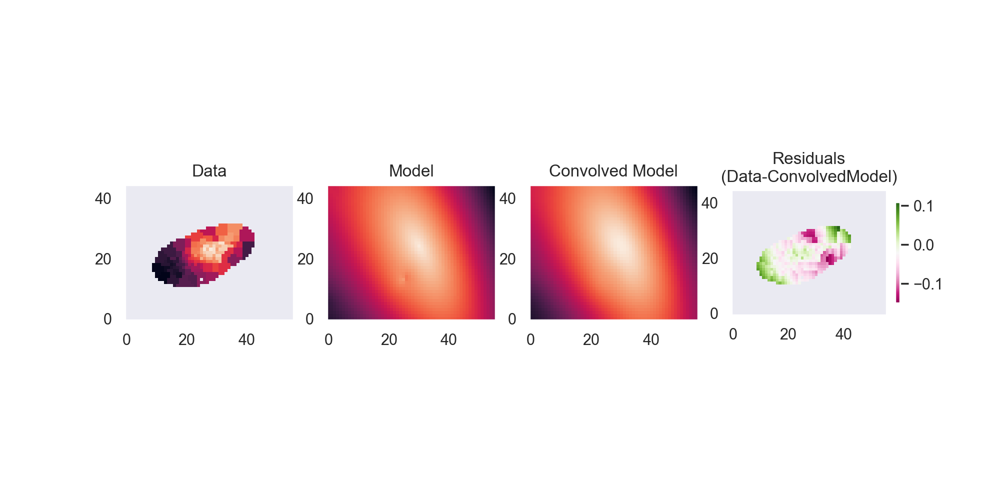

Chi2: 684.15
Chi2/dof: 1.44


In [11]:
test_param = results.best_parameters(start=1000)
test_param['q']['value'] = 0.2
test_model, test_residuals = results.plot_solution(test_param)

## Real chi2
free_par = 6
chi2_image = (residuals)**2/obs.unc**2
chi2 = np.nansum(chi2_image[np.where(np.isfinite(chi2_image))])
print('Chi2: %0.2f'%chi2)
print('Chi2/dof: %0.2f'%(chi2/(len(np.where(np.isfinite(obs.data))[0])-free_par)))

In [12]:
print('inclination',np.rad2deg(np.arcsin(np.sqrt(1-best_param['q']['value'])**2)))

inclination 29.024262281543834


#### Convert pixels to sky coordinates

In [13]:
print('Priors')
to_hsm(24,18)
to_hsm(24,27)
to_hsm(33,18)
to_hsm(33,27)

print('Best')
to_hsm(30,24) 

print('Galfit centre',wcs.all_world2pix(342.17857919,-44.53251288,1))

Priors
22h48m41.761s -44d31m57.7084s
22h48m41.8714s -44d31m56.3499s
22h48m41.6339s -44d31m56.5274s
22h48m41.7444s -44d31m55.169s
Best
22h48m41.7499s -44d31m56.0155s
Galfit centre [array(-18.1331731), array(59.01161052)]


# Some other tests

### Model with fixed PA

In [15]:
model.pa = -32
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,  -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_fixed_PA',
               nsteps=2000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits')

Using 24 walkers and fitting ['q', 'z_grad', 'cy', 'cx', 'z_0']:
MCMCing for 2000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 11.5685 minutes


In [13]:
results_fixed_pa = Output('as1063_image_plane_fixed_PA')
results_fixed_pa.check_convergence()
results_fixed_pa.make_cornerplot(start=1000)

FileNotFoundError: [Errno 2] No such file or directory: 'as1063_image_plane_fixed_PA.pickle'

q 0.8972$^{+0.0022}_{-0.0050}$
z_grad -0.0382$^{+0.0015}_{-0.0017}$
cy 25.0165$^{+0.3578}_{-0.4130}$
cx 32.2270$^{+0.5242}_{-0.5644}$
z_0 9.0734$^{+0.0071}_{-0.0076}$


<IPython.core.display.Javascript object>


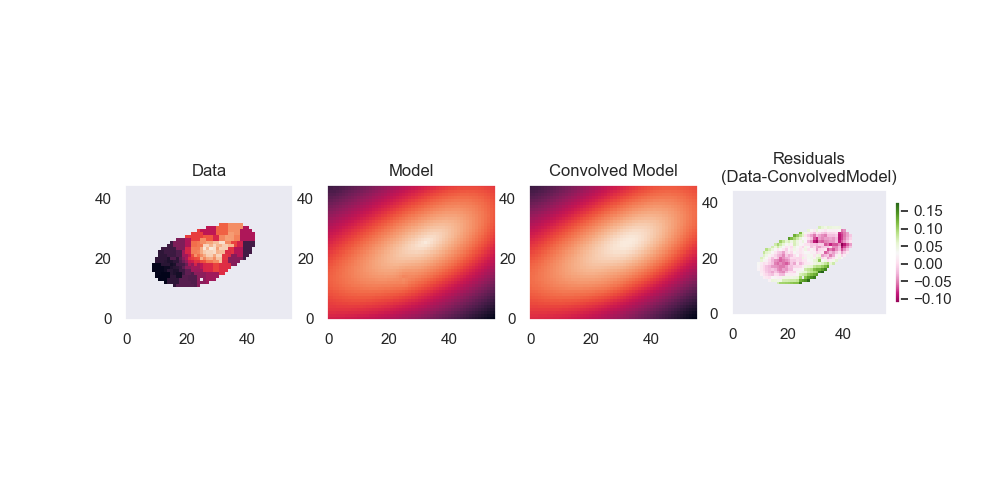

Chi2: 181.96
Chi2/dof: 1.41
Loglikelihood: 454
BIC: -879
Chi2: 669.84
Chi2/dof: 1.41


In [18]:
best_param_fixed_pa = results_fixed_pa.best_parameters(start=1000)
best_model_fixed_pa, residuals_fixed_pa = results_fixed_pa.plot_solution(best_param_fixed_pa)
chi2_dof = results.goodness_of_fit(best_param_fixed_pa)

## Real chi2
free_par = 6
chi2_image = (residuals)**2/obs.unc**2
chi2 = np.nansum(chi2_image[np.where(np.isfinite(chi2_image))])
print('Chi2: %0.2f'%chi2)
print('Chi2/dof: %0.2f'%(chi2/(len(np.where(np.isfinite(obs.data))[0])-free_par)))

### Model with masked clump

Maybe the star forming region is biasing the fit too much. Let's mask it.

<IPython.core.display.Javascript object>


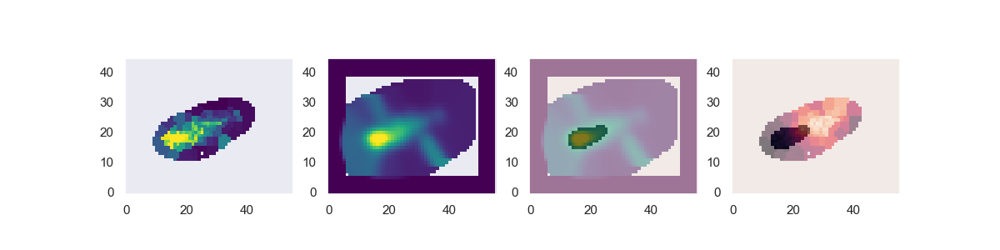

In [8]:
mask_clump = np.ones_like(obs.data)
sfr = fits.getdata('Maps/Map_SFR_density_Hb.fits')
sfr_smooth = convolve(sfr,Gaussian2DKernel(1.5))

mask_clump[np.where(sfr_smooth>0.3)] = 0 

fig, ax = plt.subplots(1,4,figsize=(12,3))
ax[0].imshow(sfr,origin='lower',cmap='viridis',vmax=0.5)
ax[1].imshow(sfr_smooth,origin='lower',cmap='viridis',vmax=0.5)

ax[2].imshow(sfr_smooth,origin='lower',cmap='viridis',vmax=0.5)
ax[2].imshow(mask_clump,alpha=0.5,origin='lower')
ax[3].imshow(obs.data,origin='lower')
ax[3].imshow(mask_clump,alpha=0.5,origin='lower')

In [10]:
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'pa', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,   20,    -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -20,     -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   90,      0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_masked_clump',
               nsteps=4000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits',
               mask=mask_clump)

Masking data
Using 24 walkers and fitting ['q', 'z_grad', 'cy', 'pa', 'cx', 'z_0']:
MCMCing for 4000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 28.5157 minutes


<IPython.core.display.Javascript object>


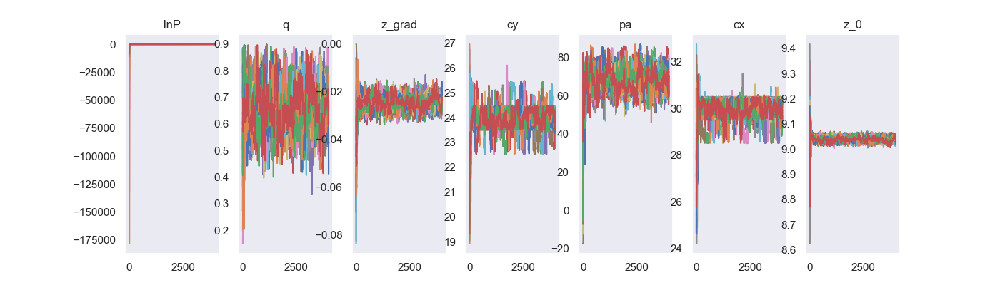

<IPython.core.display.Javascript object>


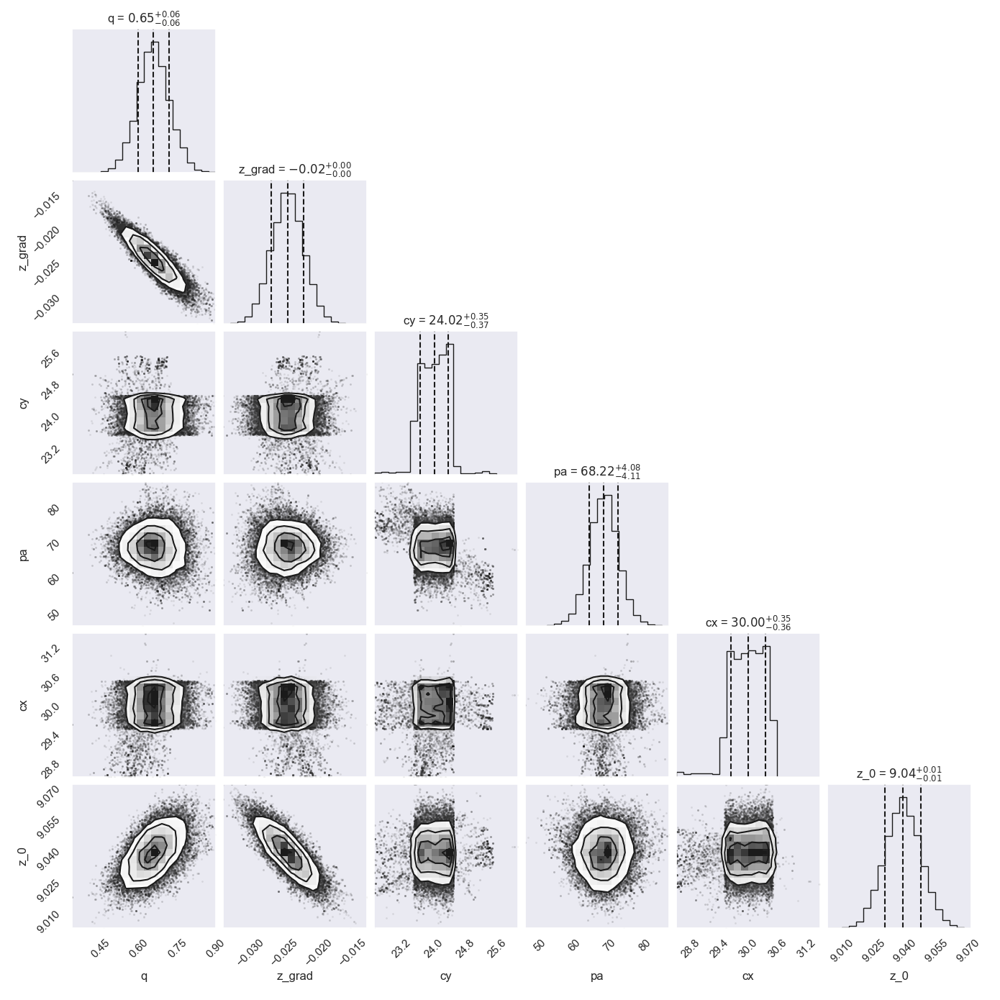

In [64]:
results_mclump = Output('as1063_image_plane_masked_clump')
results_mclump.check_convergence()
results_mclump.make_cornerplot(start=1000)

q 0.6547$^{+0.0634}_{-0.0601}$
z_grad -0.0245$^{+0.0023}_{-0.0024}$
cy 24.0239$^{+0.3460}_{-0.3679}$
pa 68.2240$^{+4.0806}_{-4.1113}$
cx 29.9986$^{+0.3526}_{-0.3595}$
z_0 9.0389$^{+0.0086}_{-0.0087}$
Masking data


<IPython.core.display.Javascript object>


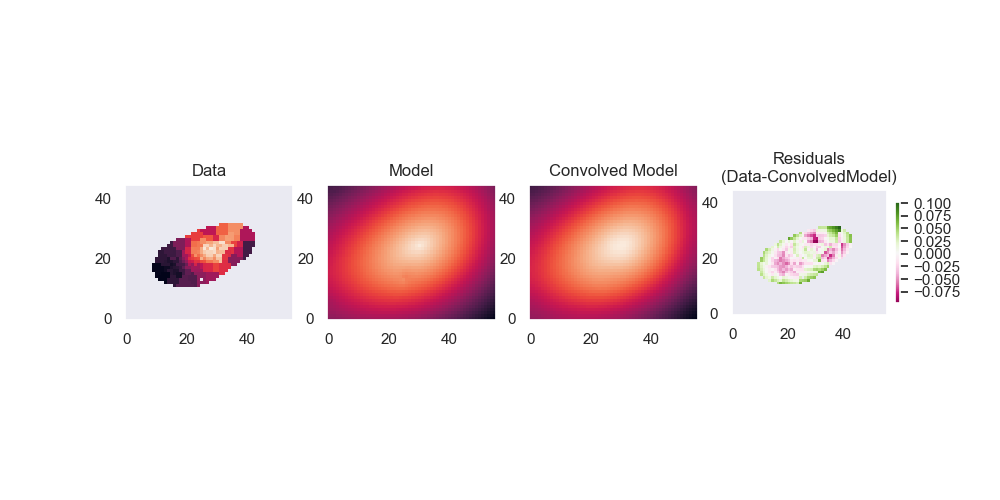

Chi2: 143.77
Chi2/dof: 1.11
Loglikelihood: 473
BIC: -917


In [65]:
best_param_mclump = results_mclump.best_parameters(start=1000)
best_model_mclump, residuals_mclump = results_mclump.plot_solution(best_param_mclump)
chi2_dof = results.goodness_of_fit(best_param_mclump)

### Model with masked inner part

<IPython.core.display.Javascript object>


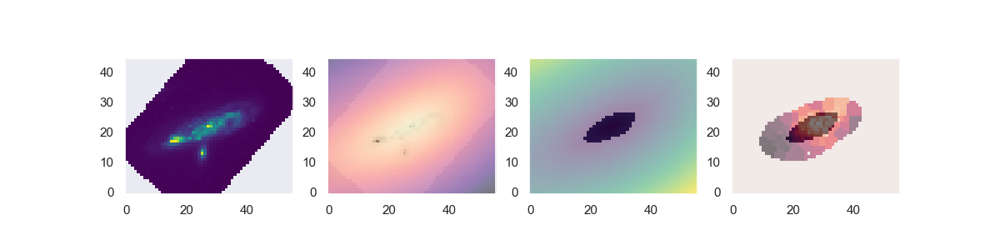

In [11]:
mask_centre = np.ones_like(obs.data)
model.cx = 27
model.cy = 22
dist_map = model.make_distance_map()
mask_centre[np.where(dist_map<4)] = 0 

fig, ax = plt.subplots(1,4,figsize=(12,3))
ax[0].imshow(hst,origin='lower',cmap='viridis',vmax=0.2)
ax[1].imshow(hst,origin='lower',cmap='Greys',vmax=0.5)
ax[1].imshow(dist_map,origin='lower',cmap='magma_r',alpha=0.5)

ax[2].imshow(dist_map,origin='lower',cmap='viridis')
ax[2].imshow(mask_centre,alpha=0.5,origin='lower')
ax[3].imshow(obs.data,origin='lower')
ax[3].imshow(mask_centre,alpha=0.5,origin='lower')

In [14]:
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'pa', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,   20,    -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -20,     -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   90,      0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_masked_centre',
               nsteps=4000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits',
               mask=mask_centre)

Masking data
Using 24 walkers and fitting ['q', 'z_grad', 'cy', 'pa', 'cx', 'z_0']:
MCMCing for 4000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 78.2908 minutes


<IPython.core.display.Javascript object>


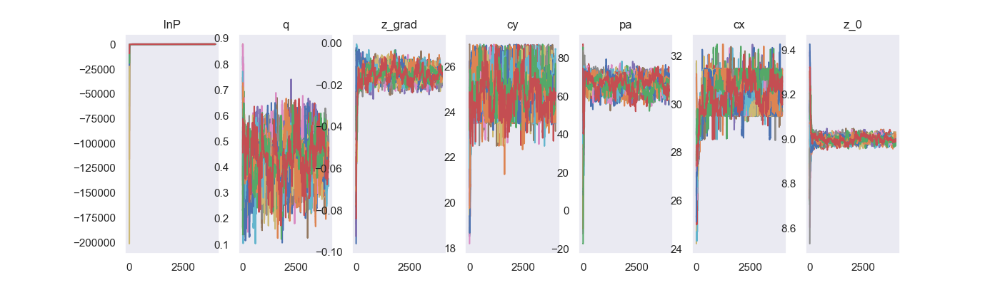

<IPython.core.display.Javascript object>


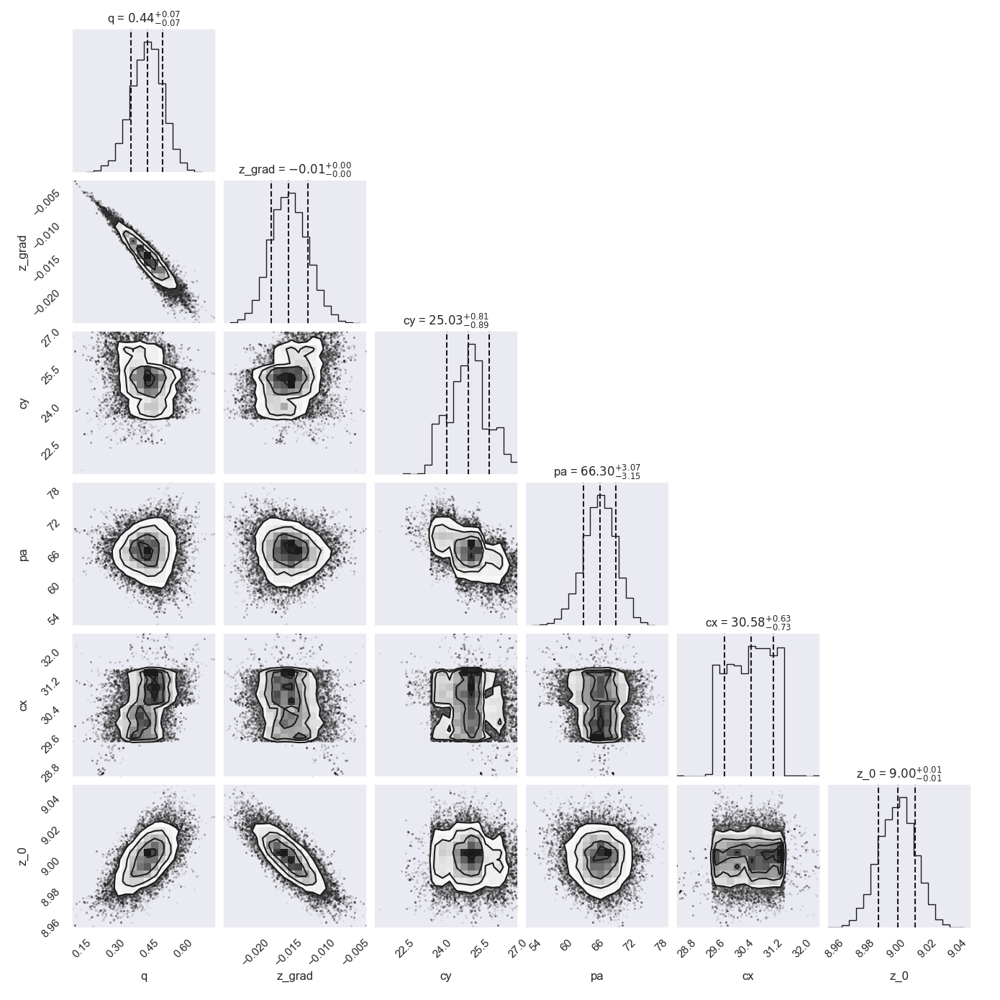

In [66]:
results_mcentre = Output('as1063_image_plane_masked_centre')
results_mcentre.check_convergence()
results_mcentre.make_cornerplot(start=1000)

q 0.4398$^{+0.0659}_{-0.0742}$
z_grad -0.0150$^{+0.0029}_{-0.0027}$
cy 25.0287$^{+0.8128}_{-0.8868}$
pa 66.2979$^{+3.0677}_{-3.1474}$
cx 30.5796$^{+0.6285}_{-0.7308}$
z_0 9.0010$^{+0.0115}_{-0.0126}$
Masking data


<IPython.core.display.Javascript object>


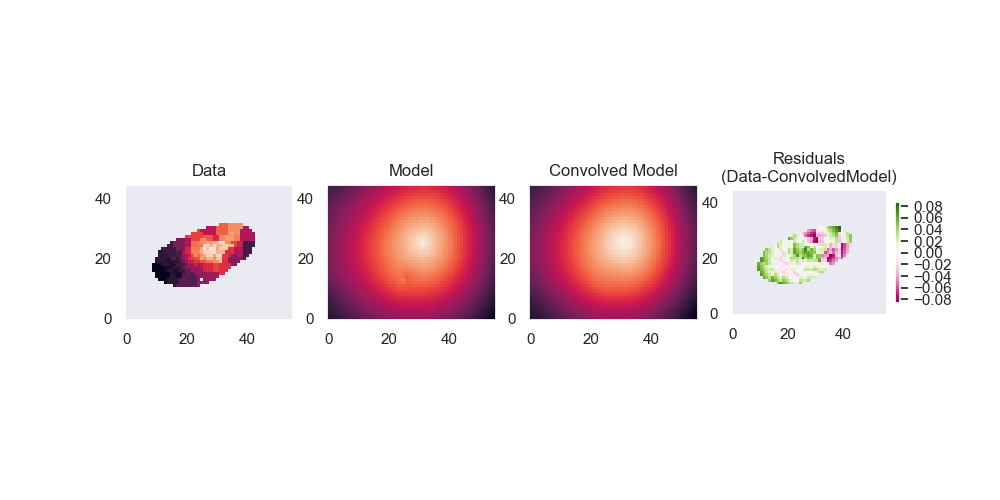

Chi2: 188.18
Chi2/dof: 1.46
Loglikelihood: 451
BIC: -873


In [67]:
best_param_mcentre = results_mcentre.best_parameters(start=1000)
best_model_mcentre, residuals_mcentre = results_mcentre.plot_solution(best_param_mcentre)
chi2_dof = results.goodness_of_fit(best_param_mcentre)

## Fit only half of the galaxy

Maybe the fact that we have more data points towards one direction than the other is biasing our data. Let's fit each half seperatly.

<IPython.core.display.Javascript object>


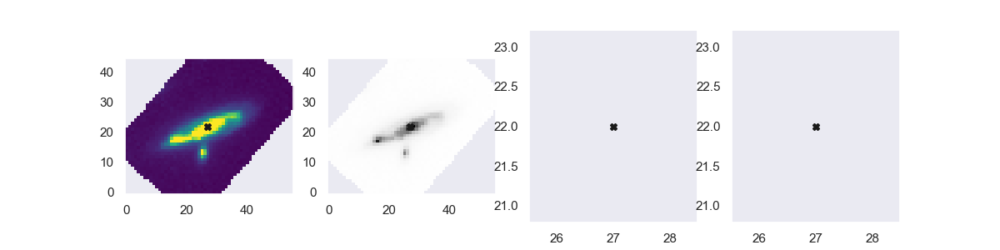

NameError: name 'dist_map' is not defined

In [14]:
mask_right = np.ones_like(obs.data)
x, y = np.meshgrid(range(obs.data.shape[0]),range(obs.data.shape[1]))
mask_right = x > 60 - 1.4*y
mask_right = mask_right.T

fig, ax = plt.subplots(1,4,figsize=(12,3))
dummy = [x.plot(27,22,marker='X',color='k') for x in ax]
ax[0].imshow(hst,origin='lower',cmap='viridis',vmax=0.2)
ax[1].imshow(hst,origin='lower',cmap='Greys',vmax=0.5)
ax[1].imshow(dist_map,origin='lower',cmap='magma_r',alpha=0.5)

ax[2].imshow(dist_map,origin='lower',cmap='viridis')
ax[2].imshow(mask_right,alpha=0.5,origin='lower')
ax[3].imshow(obs.data,origin='lower')
ax[3].imshow(mask_right,alpha=0.5,origin='lower')

In [62]:
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'pa', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,   20,    -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -20,     -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   90,      0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_masked_right',
               nsteps=4000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits',
               mask=mask_right)

Masking data
Using 24 walkers and fitting ['q', 'z_grad', 'cy', 'pa', 'cx', 'z_0']:
MCMCing for 4000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 22.9836 minutes


<IPython.core.display.Javascript object>


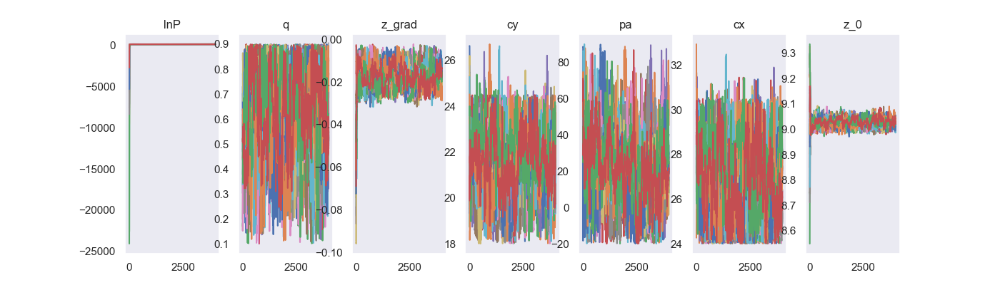

<IPython.core.display.Javascript object>


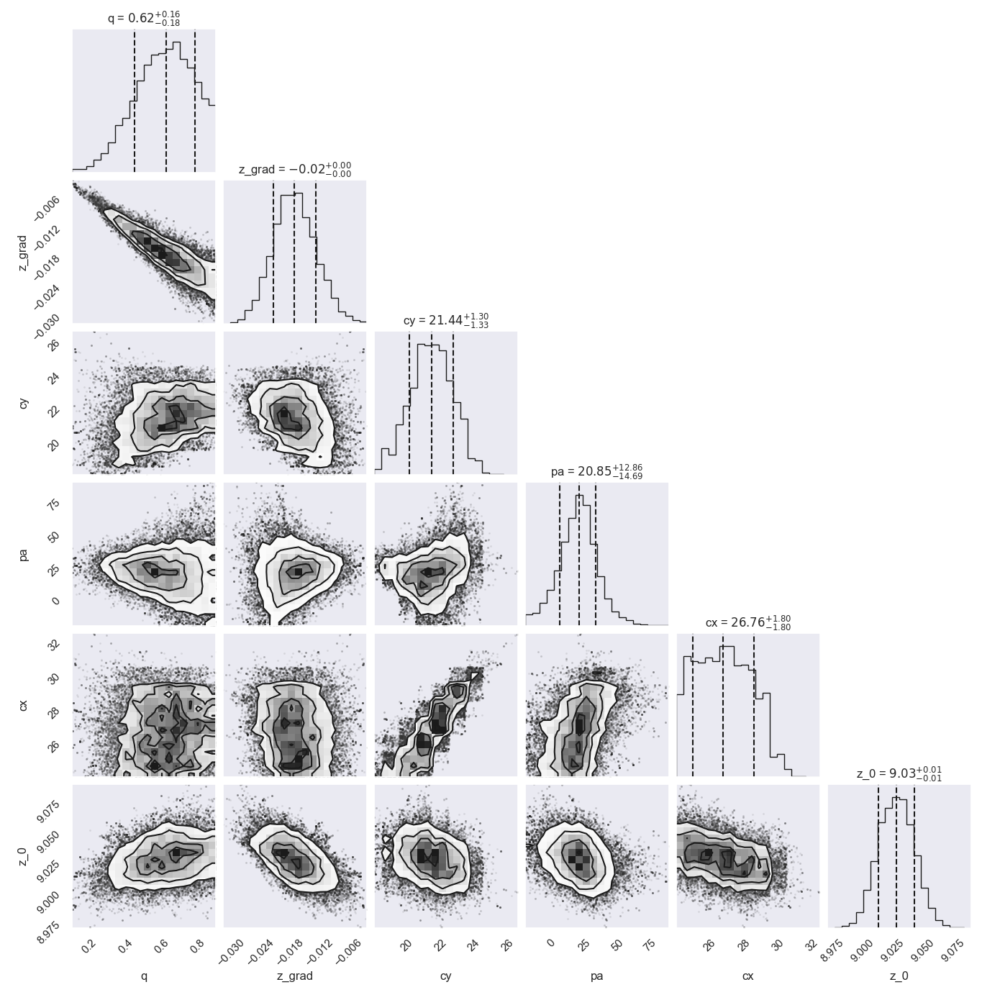

In [68]:
results_mright = Output('as1063_image_plane_masked_right')
results_mright.check_convergence()
results_mright.make_cornerplot(start=1000)

q 0.6239$^{+0.1611}_{-0.1759}$
z_grad -0.0171$^{+0.0045}_{-0.0042}$
cy 21.4427$^{+1.2984}_{-1.3316}$
pa 20.8477$^{+12.8636}_{-14.6855}$
cx 26.7639$^{+1.7967}_{-1.8001}$
z_0 9.0281$^{+0.0149}_{-0.0148}$
Masking data


<IPython.core.display.Javascript object>


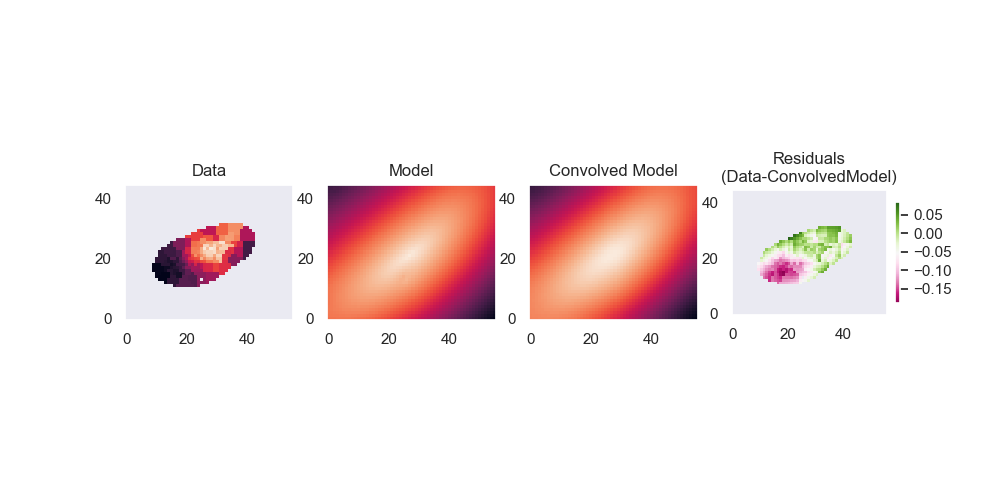

Chi2: 1397.10
Chi2/dof: 10.83
Loglikelihood: -153
BIC: 335


In [69]:
best_param_mright = results_mright.best_parameters(start=1000)
best_model_mright, residuals_mright = results_mright.plot_solution(best_param_mright)
chi2_dof = results.goodness_of_fit(best_param_mright)

<IPython.core.display.Javascript object>


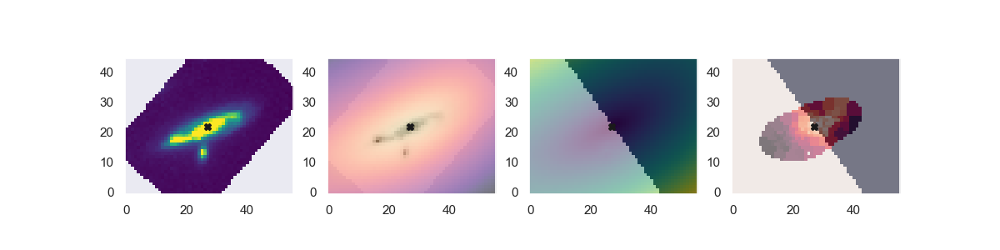

In [65]:
mask_left = np.ones_like(mask_right)
mask_left[np.where(mask_right==1)] = 0

fig, ax = plt.subplots(1,4,figsize=(12,3))
dummy = [x.plot(27,22,marker='X',color='k') for x in ax]
ax[0].imshow(hst,origin='lower',cmap='viridis',vmax=0.2)
ax[1].imshow(hst,origin='lower',cmap='Greys',vmax=0.5)
ax[1].imshow(dist_map,origin='lower',cmap='magma_r',alpha=0.5)

ax[2].imshow(dist_map,origin='lower',cmap='viridis')
ax[2].imshow(mask_left,alpha=0.5,origin='lower')
ax[3].imshow(obs.data,origin='lower')
ax[3].imshow(mask_left,alpha=0.5,origin='lower')

In [66]:
input_par = make_input_parameters(name    = ('cx', 'cy',  'q', 'pa', 'z_grad', 'z_0'),
                                 value   = (  29,   23,  0.7,   20,    -0.02, 9.0),
                                 minimum = (  24,   18,  0.1,  -20,     -0.1, 8.5),
                                 maximum = (  33,   27,  0.9,   90,      0.0, 9.5))

fit = fit_model(obs=obs,
               model=model,
               parameters=input_par,
               outputname='as1063_image_plane_masked_left',
               nsteps=4000,
               nwalkers=24,
               binning_map='Maps/Map_bins_SN_70_flux_stddev.fits',
               mask=mask_left)

Masking data
Using 24 walkers and fitting ['q', 'z_grad', 'cy', 'pa', 'cx', 'z_0']:
MCMCing for 4000 steps
0 %
10 %
20 %
40 %
80 %
Execution time: 23.9075 minutes


<IPython.core.display.Javascript object>


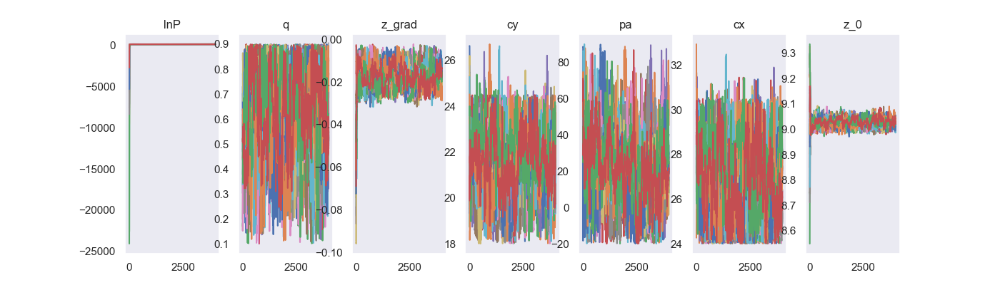

<IPython.core.display.Javascript object>


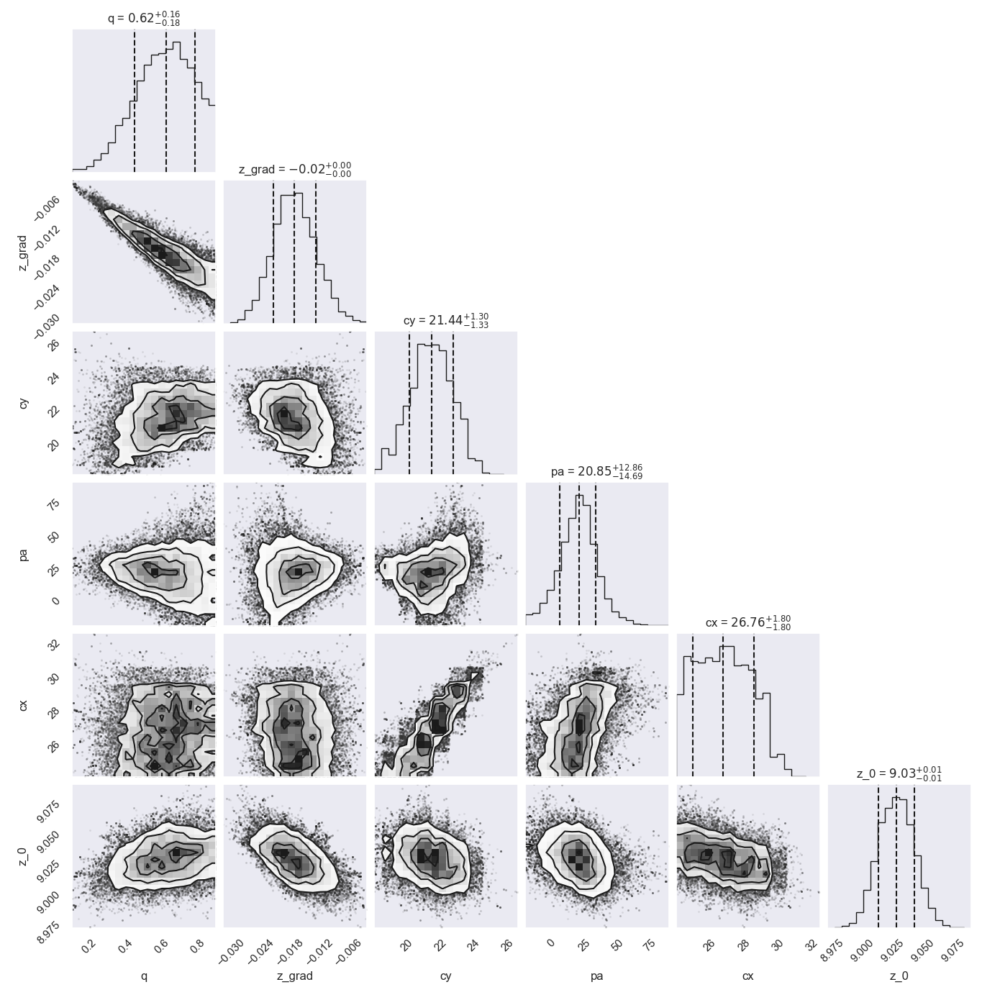

In [70]:
results_mleft = Output('as1063_image_plane_masked_right')
results_mleft.check_convergence()
results_mleft.make_cornerplot(start=1000)

q 0.6239$^{+0.1611}_{-0.1759}$
z_grad -0.0171$^{+0.0045}_{-0.0042}$
cy 21.4427$^{+1.2984}_{-1.3316}$
pa 20.8477$^{+12.8636}_{-14.6855}$
cx 26.7639$^{+1.7967}_{-1.8001}$
z_0 9.0281$^{+0.0149}_{-0.0148}$
Masking data


<IPython.core.display.Javascript object>


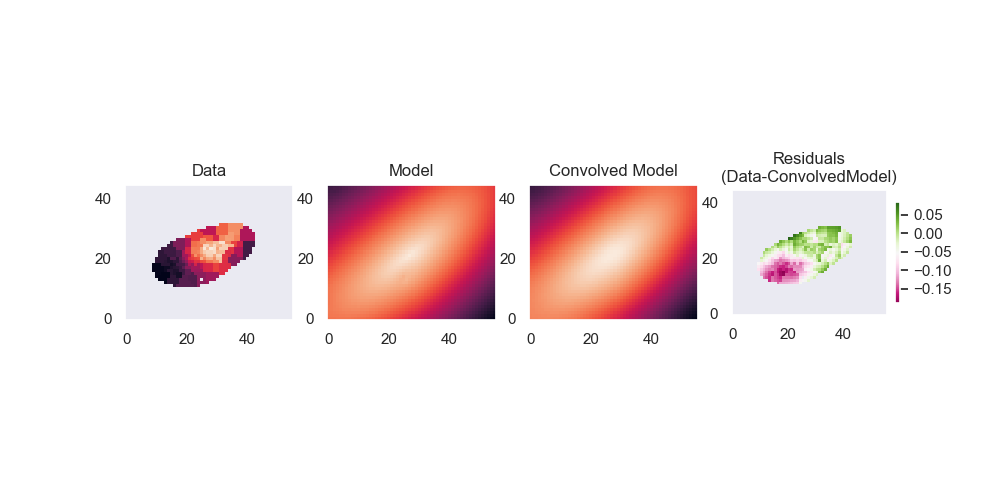

Chi2: 1397.10
Chi2/dof: 10.83
Loglikelihood: -153
BIC: 335


In [71]:
best_param_mleft = results_mleft.best_parameters(start=1000)
best_model_mleft, residuals_mleft = results_mleft.plot_solution(best_param_mleft)
chi2_dof = results.goodness_of_fit(best_param_mleft)

# Summary

| Name             | dexperkpc | peakmet | cx    | cy    | q      | pa       | chi2/dof | BIC    |
|------------------|-----------|---------|-------|-------|--------|----------|----------|--------|
| All Free         | -0.0217   | 9.0377  | 30.0287    | 23.9753    | 0.5218 | 68.1354    | 0.81 | -957  |
| HST Centre       | -0.0163   | 8.9941  | 27 | 22| 0.3757 | 70.4452    | 3.38    |   -626
| Masked Clump     | -0.0245   | 9.0389  | 29.9986 | 24.0239 | 0.6547 | 68.2240    | 1.11    | -917  |
| Masked Centre    | -0.0150   | 9.0010  | 30.5796 | 25.0287 | 0.4398 | 66.2979    | 1.46    | -873  |



Compare the centres

<IPython.core.display.Javascript object>


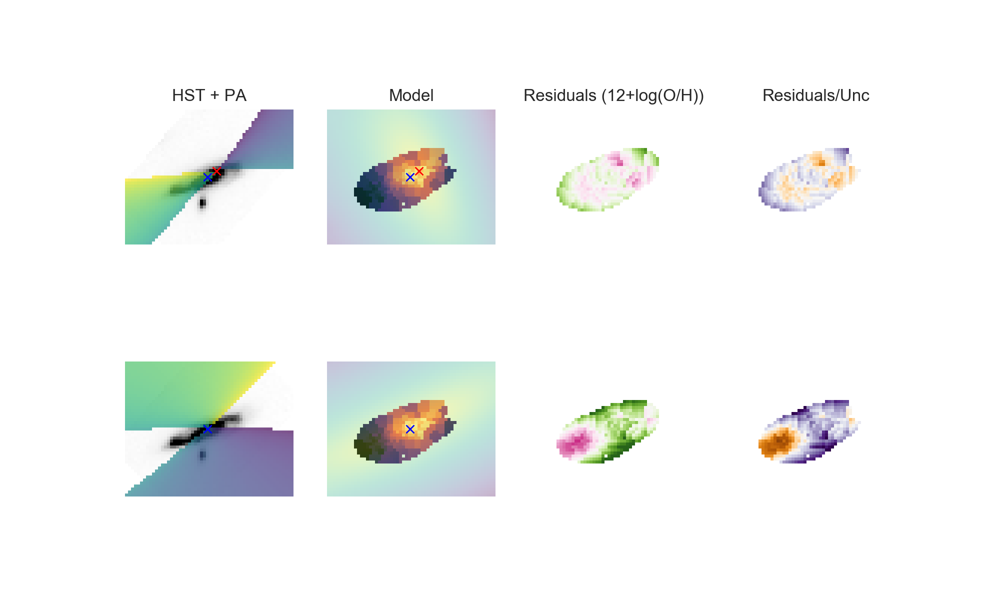

In [29]:
fig, ax = plt.subplots(2,4,figsize=(10,6))
ax = ax.ravel()
hst, _ = reproject_interp('../../Data/HST/AS1063_F160w.fits',obs.header)

def plot_to_compare(model,residuals,param,ax0,ax1,ax2,ax3):

    ax0.imshow(hst,cmap='Greys',origin='lower',vmax=0.2)
    ang = model.make_azimuthal_map()
    ax0.imshow(ang,cmap='viridis',origin='lower',alpha=0.7)

    try:
        ax0.plot(param['cx']['value'],param['cy']['value'],marker='x',color='red')
    except:
        pass
    ax0.plot(27,22,marker='x',color='blue')
    ax1.imshow(obs.data,cmap='magma',origin='lower')
    ax1.imshow(model.data,cmap='viridis',origin='lower',alpha=0.3)
    try:
        ax1.plot(param['cx']['value'],best_param['cy']['value'],marker='x',color='red')
    except:
        pass
    ax1.plot(27,22,marker='x',color='blue')
    ax2.imshow(residuals,cmap='PiYG',origin='lower',vmin=-0.15,vmax=0.15)
    ax3.imshow(residuals/obs.unc,cmap='PuOr',origin='lower',vmin=-5,vmax=5)
    
plot_to_compare(best_model,residuals,best_param,ax[0],ax[1],ax[2],ax[3])
plot_to_compare(best_model_fixed_morph,residuals_fixed_morph,best_param_fixed_morph,ax[4],ax[5],ax[6],ax[7])

ax[0].set_title('HST + PA')
ax[1].set_title('Model')
ax[2].set_title('Residuals (12+log(O/H))')
ax[3].set_title('Residuals/Unc')

d = [x.axis('off') for x in ax]

## Make 1D plot

In [14]:
sns.set_style('darkgrid')
sns.set(font_scale=1.3)

In [17]:
def measure_in_vbins(im,stat):
    if stat == 'mean':
        return np.array([sigma_clipped_stats(im[np.where(voronoi_map==v)])[0] for v in bins ])
    if stat == 'std':
        return np.array([sigma_clipped_stats(im[np.where(voronoi_map==v)])[2] for v in bins ])

def bin_data_r(data,dist):
    binned_data, bin_edges, bin_number = binned_statistic(dist,data,'mean',bins=range(0,20))
    binned_err, bin_edges, bin_number = binned_statistic(dist,data,'std',bins=range(0,20))
    bin_width = (bin_edges[1] - bin_edges[0])
    bin_centers = bin_edges[1:] - bin_width/2
    return binned_data, binned_err, bin_centers

def bin_data_ang(data,ang):
    binned_data, bin_edges, bin_number = binned_statistic(ang,data,'mean',bins=range(0,360,20))
    binned_err, bin_edges, bin_number = binned_statistic(ang,data,'std',bins=range(0,360,20))
    bin_width = (bin_edges[1] - bin_edges[0])
    bin_centers = bin_edges[1:] - bin_width/2
    return binned_data, binned_err, bin_centers

In [18]:
voronoi_map = fits.getdata('Maps/Map_bins_SN_70_flux_stddev.fits')
voronoi_map[np.where(voronoi_map==-1)] = np.nan
bins = np.unique(voronoi_map)
bins = bins[~np.isnan(bins)]
size_vbin = np.array([len(np.atleast_1d(np.where(voronoi_map==v)[0])) for v in bins ])

In [19]:
def set_figure():
    
    fig, ax = plt.subplots(3,2,figsize=(6,8))
    fig.subplots_adjust(top=0.98,left=0.13,right=0.99,wspace=0.02,hspace=0.05,bottom=0.06)
    ax = ax.ravel()
    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=ax[4],height_ratios=[2,1])
    gs40 = plt.Subplot(fig, gs4[0])
    fig.add_subplot(gs40)
    gs41 = plt.Subplot(fig, gs4[1])
    fig.add_subplot(gs41)
    ax[4].axis('off')
    gs5 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=ax[5],height_ratios=[2,1])
    gs50 = plt.Subplot(fig, gs5[0])
    fig.add_subplot(gs50)
    gs51 = plt.Subplot(fig, gs5[1])
    fig.add_subplot(gs51)
    ax[5].axis('off')
    return fig,ax,gs40,gs41,gs50,gs51

def set_axis(ax,gs40,gs41,gs50,gs51):
    
    ax[0].set_ylim(8.65,9.07)
    ax[2].set_ylim(8.65,9.07)
    gs40.set_ylim(8.65,9.07)
    ax[1].set_ylim(8.65,9.07)
    ax[3].set_ylim(8.65,9.07)
    gs50.set_ylim(8.65,9.07)
    gs41.set_ylim(-0.1,0.1)
    gs51.set_ylim(-0.1,0.1)
    ax[0].set_xlim(-1,10)
    ax[2].set_xlim(-1,10)
    gs40.set_xlim(-1,10)
    gs41.set_xlim(-1,10)
    ax[1].set_xlim(-20,390)
    ax[3].set_xlim(-20,390)
    gs50.set_xlim(-20,390)
    gs51.set_xlim(-20,390)

    ax[0].set_ylabel('Data\n12 + log(O/H)')
    ax[2].set_ylabel('Model\n12 + log(O/H)')
    gs40.set_ylabel('12 + log(O/H)')
    gs41.set_ylabel('$\Delta$')

    gs41.set_xlabel('Radius (kpc)')
    gs51.set_xlabel('$\Theta$ (deg)')

    ax[0].tick_params(labelbottom=False,direction='in')    
    ax[2].tick_params(labelbottom=False,direction='in')  
    ax[1].tick_params(labelbottom=False,direction='in',labelleft=False)    
    ax[3].tick_params(labelbottom=False,direction='in',labelleft=False)
    gs50.tick_params(labelbottom=False,direction='in',labelleft=False) 
    gs51.tick_params(direction='in',labelleft=False) 
    gs41.tick_params(direction='in') 
    

def simpler_plot(obs,model,res):
   
    cmap_sectors = sns.cubehelix_palette(5, start=.5, rot=-.75,dark=0.25,reverse=False,as_cmap=True)
    blue = sns.cubehelix_palette(5, start=.5, rot=-.75,dark=0.25,reverse=True)[0]
    
    fig, ax = plt.subplots(3,1,figsize=(3.5,8))
    fig.subplots_adjust(top=0.95,left=0.22,right=0.99,wspace=0.02,hspace=0.05,bottom=0.1)
    gs4 = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=ax[2],height_ratios=[2,1])
    gs40 = plt.Subplot(fig, gs4[0])
    fig.add_subplot(gs40)
    gs41 = plt.Subplot(fig, gs4[1])
    fig.add_subplot(gs41)
    ax[2].axis('off')
    
    ax[0].set_ylim(8.65,9.07)
    ax[1].set_ylim(8.65,9.07)
    gs40.set_ylim(8.65,9.07)
    gs41.set_ylim(-0.1,0.1)
    ax[0].set_xlim(-1,10)
    ax[1].set_xlim(-1,10)
    gs40.set_xlim(-1,10)
    gs41.set_xlim(-1,10)
    
    ax[0].set_ylabel('Data\n12 + log(O/H)',labelpad=0.1)
    ax[1].set_ylabel('Model\n12 + log(O/H)',labelpad=0.1)
    gs40.set_ylabel('12 + log(O/H)')
    gs41.set_ylabel('$\Delta$')
    gs41.set_xlabel('Radius (kpc)')

    ax[0].tick_params(labelbottom=False,direction='in')    
    ax[1].tick_params(labelbottom=False,direction='in') 
    gs40.tick_params(labelbottom=False,direction='in')  
    gs41.tick_params(direction='in') 
        
    # Metallicity
    met_vbin     = measure_in_vbins(obs.data,'mean')
    emet_vbin    = measure_in_vbins(obs.unc,'mean')
    met_vbin_std = measure_in_vbins(obs.data,'std') 
    met_vbin_err = np.sqrt(emet_vbin**2 + met_vbin_std**2)

    # Model
    model.conv_data
    model_vbin     = measure_in_vbins( model.conv_data,'mean')
    model_vbin_std = measure_in_vbins( model.conv_data,'std')

    # Residuals
    res_vbin = measure_in_vbins(res,'mean') 
    res_vbin = measure_in_vbins(res,'mean') 

    # Morphology
    distance_map = model.make_distance_map()
    dist_vbin     = measure_in_vbins(distance_map,'mean')
    dist_vbin_std = measure_in_vbins(distance_map,'std')
    angular_map = model.make_azimuthal_map()
    ang_vbin     = measure_in_vbins(angular_map,'mean')
    ang_std_vbin = measure_in_vbins(angular_map,'std')

    # Radial
    cmap = sns.cubehelix_palette(5, start=.5, rot=-.75,dark=0.25,reverse=True,as_cmap=True)
    ax[0].errorbar(dist_vbin, met_vbin, xerr=dist_vbin_std, yerr=met_vbin_err, linestyle='', ecolor='0.6', elinewidth=0.4)
    #ax[0].scatter(dist_vbin, met_vbin, linewidths=None, alpha=0.95, marker='.', cmap=cmap, c=ang_vbin, s=size_vbin**2+35,zorder=10)
    #ax[1].scatter(dist_vbin, model_vbin, linewidths=None, alpha=0.95, marker='s', cmap=cmap, c=ang_vbin, s=size_vbin**1.3+10)
    ax[0].scatter(dist_vbin, met_vbin, linewidths=None, alpha=0.95, marker='.', cmap=cmap_sectors, c=bins, s=50 ,zorder=10)
    ax[1].scatter(dist_vbin, model_vbin, linewidths=None, alpha=0.95, marker='s', cmap=cmap_sectors, c=bins, s=30)
    #ax[0].scatter(dist_vbin, met_vbin, linewidths=None, alpha=0.95, marker='.', color=blue, zorder=10,s=50)
    #ax[1].scatter(dist_vbin, model_vbin, linewidths=None, alpha=0.95, marker='s', color=blue, s=50)

    # Radial residuals
    met_rbin, met_std_rbin, dist_rbin = bin_data_r(met_vbin,dist_vbin)
    model_rbin, model_std_rbin, dist_rbin = bin_data_r(model_vbin,dist_vbin)
    res_rbin = met_rbin - model_rbin
    gs40.errorbar(dist_rbin, met_rbin, yerr=met_std_rbin, linestyle='', alpha=0.95, marker='o',color='0.2',label='Binned Data')
    gs40.errorbar(dist_rbin, model_rbin, yerr=model_std_rbin, linestyle='', alpha=0.75, marker='s',color='#516572',label='Binned Model')
    gs41.scatter(dist_rbin, res_rbin, linewidths=None, alpha=0.95, marker='X',color='0.2',label='Residuals')
    gs40.legend(fontsize=9)

    return fig,ax[0],ax[1],gs40,gs41

<IPython.core.display.Javascript object>


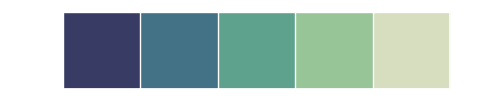

In [7]:
sns.palplot(sns.cubehelix_palette(5, start=.5, rot=-.75,dark=0.25,reverse=True))

<IPython.core.display.Javascript object>


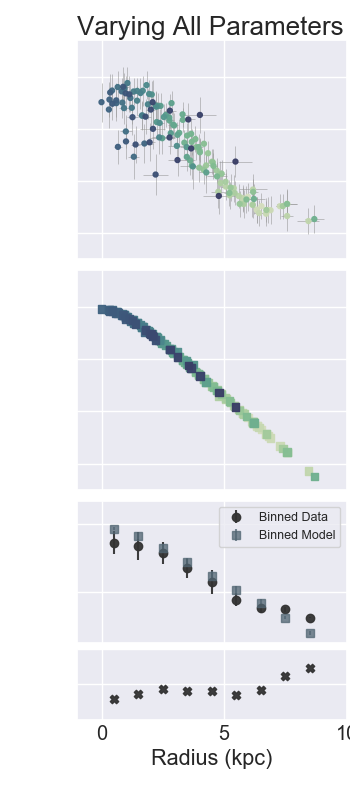

In [20]:
fig,ax0,ax1,ax20,ax21 = simpler_plot(obs,best_model,residuals)
ax0.set_ylabel('')
ax1.set_ylabel('')
ax20.set_ylabel('')
ax21.set_ylabel('')
ax0.tick_params(labelleft=False) 
ax1.tick_params(labelleft=False) 
ax20.tick_params(labelleft=False) 
ax21.tick_params(labelleft=False) 
fig.suptitle('Varying All Parameters',x=0.6,y=0.98)
fig.savefig('../../Plots/AS1063_1d_all_free.pdf')

<IPython.core.display.Javascript object>


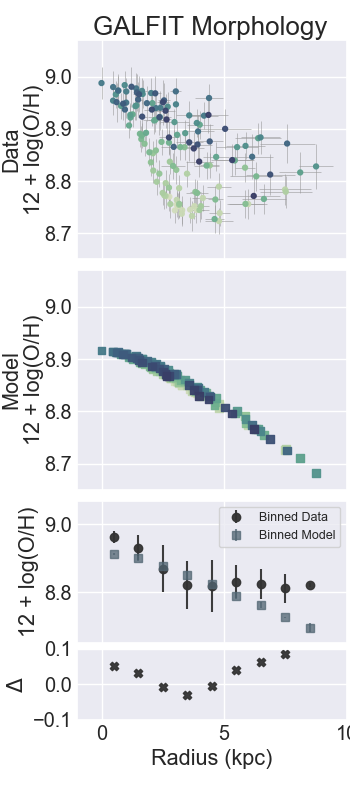

In [21]:
fig,ax0,ax1,ax20,ax21 = simpler_plot(obs,best_model_fixed_morph,residuals_fixed_morph)
fig.suptitle('GALFIT Morphology',x=0.6,y=0.98)
fig.savefig('../../Plots/AS1063_1d_galfit.pdf')

## Look at residuals

In [15]:
## Data for Correlation
mass_density_map = fits.getdata('Maps/Map_mass_density.fits')
mass_density_map_unc = fits.getdata('Maps/Map_mass_density_unc.fits')
sfr_density_map = fits.getdata('Maps/Map_SFR_density_Hb.fits')
sfr_density_map_unc = fits.getdata('Maps/Map_SFR_density_Hb_unc.fits')
voronoi_map = fits.getdata('Maps/Map_bins_SN_70_flux_stddev.fits')
voronoi_map[np.where(voronoi_map==-1)] = np.nan
bins = np.unique(voronoi_map)
bins = bins[~np.isnan(bins)]

# Scatter plot
def measure_in_vbins(im):
    return np.array([sigma_clipped_stats(im[np.where(voronoi_map==v)])[0] for v in bins ])

# Metallicity
res_vbin =  measure_in_vbins(residuals)
res_morph_vbin = measure_in_vbins(residuals_fixed_morph)

dmass_vbin  = measure_in_vbins(mass_density_map) 
dmass_vbin_unc  = measure_in_vbins(mass_density_map_unc) 

dsfr_vbin    = measure_in_vbins(sfr_density_map)
dsfr_vbin_unc= measure_in_vbins(sfr_density_map_unc)

hst, _ = reproject_interp('../../Data/HST/AS1063_F160w.fits',fits.getheader('Maps/Map_mass_density.fits'))

<IPython.core.display.Javascript object>


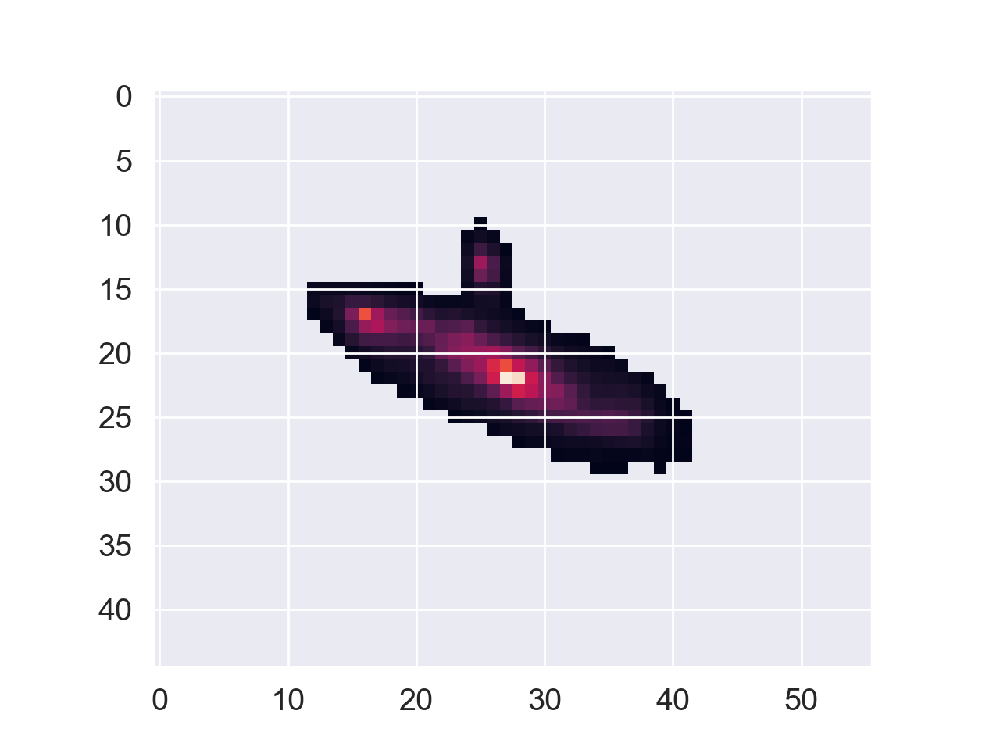

In [16]:
plt.figure()
hst_test = hst.copy()
hst_test[np.where(hst_test<0.03)] = np.nan
plt.imshow(hst_test)

<IPython.core.display.Javascript object>


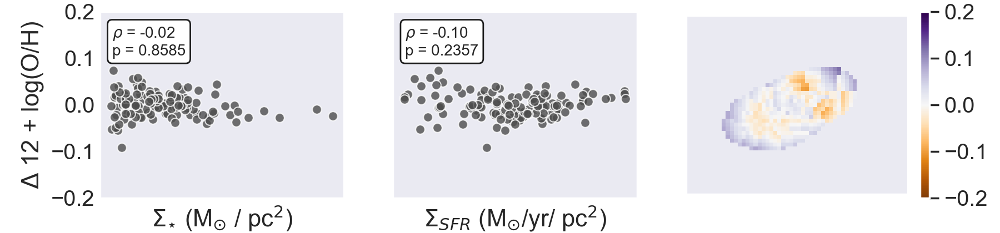

In [26]:
from scipy.stats import spearmanr
sns.set_style('dark')
fig, ax = plt.subplots(1,3,figsize=(9,2.1))
fig.subplots_adjust(left=0.1,right=0.93,top=0.95,bottom=0.15)
ax = ax.ravel()

mass_color = '0.3'
sfr_color = '0.3'
bbox_props = dict(boxstyle="round", fc='w',ec="k", alpha=1)

# Model free
cax = ax[2].imshow(residuals,cmap='PuOr',vmin=-0.2,vmax=0.2,origin='lower')
plt.colorbar(cax,ax=ax[2],orientation='vertical',fraction=0.04)
sns.scatterplot(dmass_vbin,res_vbin,ax=ax[1],color=mass_color,alpha=0.8)
sns.scatterplot(dsfr_vbin,res_vbin,ax=ax[0],color=sfr_color,alpha=0.8)
ax[0].annotate('$\\rho$ = %0.2f\np = %0.4f'%spearmanr(dmass_vbin,res_vbin),
            xy=(0.05, 0.77), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)
ax[1].annotate('$\\rho$ = %0.2f\np = %0.4f'%spearmanr(dsfr_vbin,res_vbin),
            xy=(0.05, 0.77), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)    

# Titles and legends
ax[0].tick_params(labelbottom=False,direction='in') 
ax[1].tick_params(labelbottom=False,labelleft=False,direction='in') 
ax[2].tick_params(labelbottom=False,labelleft=False)
ax[0].set_ylabel('$\Delta$ 12 + log(O/H)')
ax[0].set_ylim(-0.2,0.2)
ax[1].set_ylim(-0.2,0.2)

ax[0].set_xlabel('$\Sigma_{\star}$ (M$_{\odot}$ / pc$^{2}$)')
ax[1].set_xlabel('$\Sigma_{SFR}$ (M$_{\odot}$/yr/ pc$^{2}$)')

fig.savefig('../../Plots/AS1063_residuals.pdf')

<IPython.core.display.Javascript object>


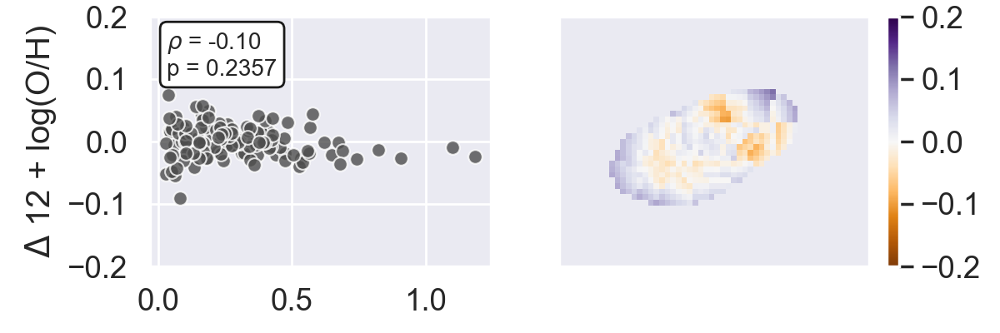

In [35]:
from scipy.stats import spearmanr
sns.set(font_scale=1.2)
fig, ax = plt.subplots(1,2,figsize=(6.0,2.0))
fig.subplots_adjust(left=0.15,right=0.90,top=0.95,bottom=0.20)
ax = ax.ravel()

mass_color = '0.3'
sfr_color = '0.3'
bbox_props = dict(boxstyle="round", fc='w',ec="k", alpha=1)

# Model free
sns.scatterplot(dsfr_vbin,res_vbin,ax=ax[0],color=sfr_color,alpha=0.8)
ax[0].annotate('$\\rho$ = %0.2f\np = %0.4f'%spearmanr(dsfr_vbin,res_vbin),
            xy=(0.05, 0.77), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)    

cax = ax[1].imshow(residuals,cmap='PuOr',vmin=-0.2,vmax=0.2,origin='lower')
plt.colorbar(cax,ax=ax[1],orientation='vertical',fraction=0.04)


# Titles and legends
ax[1].tick_params(labelbottom=False,labelleft=False)
ax[0].set_ylabel('$\Delta$ 12 + log(O/H)')
ax[0].set_ylim(-0.2,0.2)
ax[1].grid(False)
#ax[0].set_xlabel('$\Sigma_{SFR}$ (M$_{\odot}$/yr/ pc$^{2}$)')

fig.savefig('../../Plots/AS1063_residuals_v2.pdf')

<IPython.core.display.Javascript object>


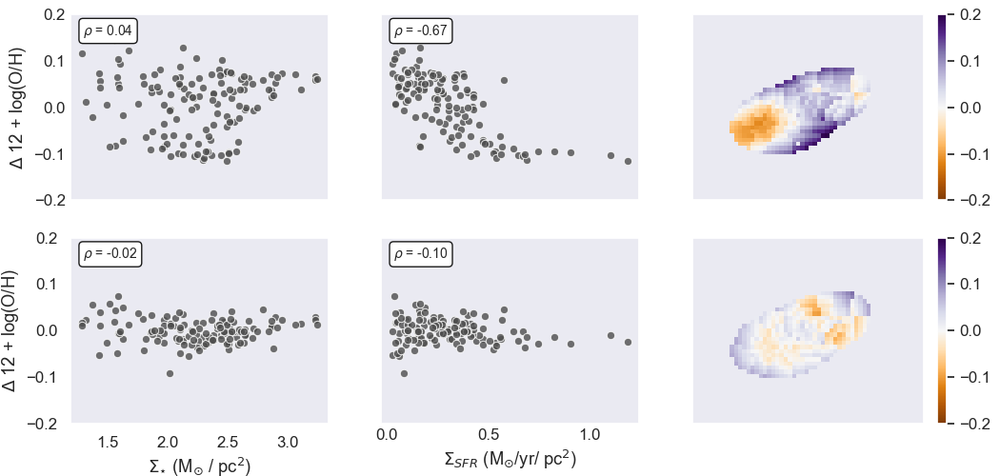

In [34]:
from scipy.stats import spearmanr
sns.set_style('dark')
fig, ax = plt.subplots(2,3,figsize=(10.5,5))
fig.subplots_adjust(left=0.07,right=0.95,top=0.97)
ax = ax.ravel()

mass_color = '0.3'
sfr_color = '0.3'

# Model with fixed morphology
cmap_met = sns.cubehelix_palette(start=3, light=0.95, as_cmap=True)
#ax[2].countour(hst_test,cmap='Greys',vmin=0,vmax=0.3,origin='lower')
cax = ax[2].imshow(residuals_fixed_morph,cmap='PuOr',vmin=-0.2,vmax=0.2,origin='lower')
plt.colorbar(cax,ax=ax[2],orientation='vertical',fraction=0.05)
sns.scatterplot(dmass_vbin,res_morph_vbin,ax=ax[0],color=mass_color,alpha=0.8)
sns.scatterplot(dsfr_vbin,res_morph_vbin,ax=ax[1],color=sfr_color,alpha=0.8)
bbox_props = dict(boxstyle="round", fc='w',ec="k", alpha=1)
ax[0].annotate('$\\rho$ = %0.2f'%spearmanr(dmass_vbin,res_morph_vbin)[0],
            xy=(0.05, 0.89), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)
ax[1].annotate('$\\rho$ = %0.2f'%spearmanr(dsfr_vbin,res_morph_vbin)[0],
            xy=(0.05, 0.89), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)    
# Model free
#ax[5].imshow(hst_test,cmap='Greys',vmin=0,vmax=0.3,origin='lower')
cax = ax[5].imshow(residuals,cmap='PuOr',vmin=-0.2,vmax=0.2,origin='lower')
plt.colorbar(cax,ax=ax[5],orientation='vertical',fraction=0.05)
sns.scatterplot(dmass_vbin,res_vbin,ax=ax[3],color=mass_color,alpha=0.8)
sns.scatterplot(dsfr_vbin,res_vbin,ax=ax[4],color=sfr_color,alpha=0.8)
ax[3].annotate('$\\rho$ = %0.2f'%spearmanr(dmass_vbin,res_vbin)[0],
            xy=(0.05, 0.89), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)
ax[4].annotate('$\\rho$ = %0.2f'%spearmanr(dsfr_vbin,res_vbin)[0],
            xy=(0.05, 0.89), xycoords='axes fraction',bbox=bbox_props,zorder=20,fontsize=10)    

# Titles and legends
ax[0].tick_params(labelbottom=False,direction='in') 
ax[1].tick_params(labelbottom=False,labelleft=False,direction='in') 
ax[4].tick_params(labelleft=False,direction='in') 
ax[2].tick_params(labelbottom=False,labelleft=False)
ax[5].tick_params(labelbottom=False,labelleft=False) 
ax[0].set_ylabel('$\Delta$ 12 + log(O/H)')
ax[3].set_ylabel('$\Delta$ 12 + log(O/H)')
ax[0].set_ylim(-0.2,0.2)
ax[1].set_ylim(-0.2,0.2)
ax[3].set_ylim(-0.2,0.2)
ax[4].set_ylim(-0.2,0.2)

ax[3].set_xlabel('$\Sigma_{\star}$ (M$_{\odot}$ / pc$^{2}$)')
ax[4].set_xlabel('$\Sigma_{SFR}$ (M$_{\odot}$/yr/ pc$^{2}$)')

fig.savefig('../../Plots/AS1063_residuals-both.pdf')

## Test with the mass metallicity relation

<IPython.core.display.Javascript object>


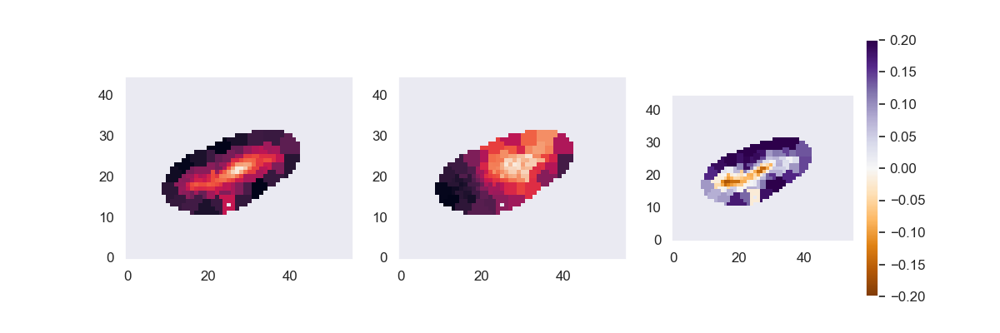

In [100]:
def MZR(mass):
    return 8.21 + 0.28*mass


grad = MZR(mass_density_map)

fig, ax = plt.subplots(1,3,figsize=(12,4))
ax[0].imshow(grad,origin='lower')
ax[1].imshow(obs.data,origin='lower')
cax = ax[2].imshow(obs.data-grad,origin='lower',cmap='PuOr',vmin=-0.2,vmax=0.2)
plt.colorbar(cax,ax=ax[2])

<IPython.core.display.Javascript object>


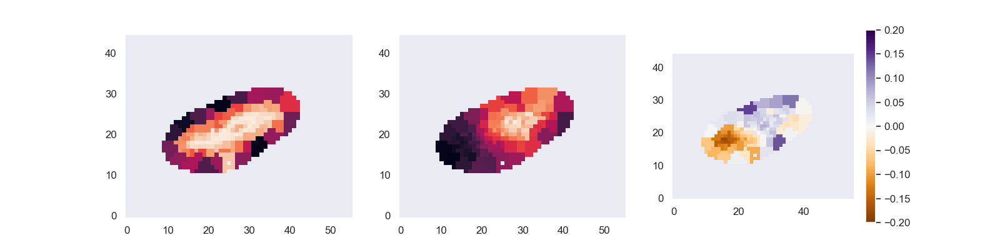

<IPython.core.display.Javascript object>


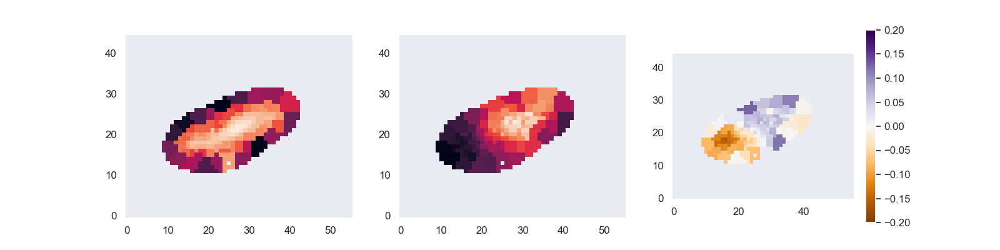

<IPython.core.display.Javascript object>


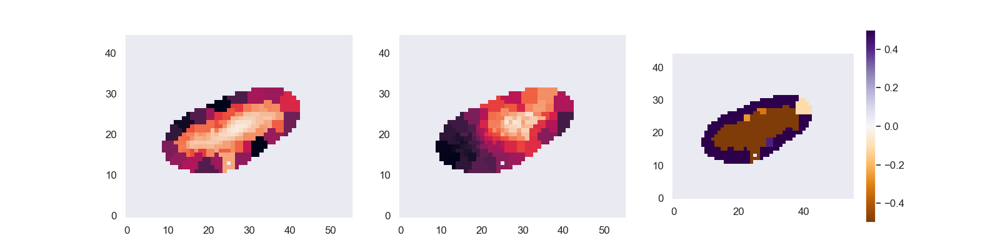

In [154]:
def rosalesortega2012(logmass):
    return 8.079 + 0.525*logmass -0.098*logmass**2

def barreraballesteros2016(logmass):
    a,b,c = 8.55, 0.014, 3.14
    x = logmass 
    return a + b*(x - c) *np.exp(-(x-c))

def sanchez2013(logmass):
    a,b,c = 8.86, 0.97, 2.80
    x = logmass 
    return a + b*(x - c)*np.exp(-(x-c))

grad_A = rosalesortega2012(mass_density_map)
fig, ax = plt.subplots(1,3,figsize=(16,4))
ax[0].imshow(grad_A,origin='lower')
ax[1].imshow(obs.data,origin='lower')
resA = (obs.data-grad_A) - np.nanmean(obs.data-grad_A)
cax = ax[2].imshow(resA,origin='lower',cmap='PuOr',vmin=-0.2,vmax=0.2)
plt.colorbar(cax,ax=ax[2])

grad_B = barreraballesteros2016(mass_density_map)
fig, ax = plt.subplots(1,3,figsize=(16,4))
ax[0].imshow(grad_B,origin='lower')
ax[1].imshow(obs.data,origin='lower')
resB = (obs.data-grad_B) - np.nanmean(obs.data-grad_B)
cax = ax[2].imshow(resB,origin='lower',cmap='PuOr',vmin=-0.2,vmax=0.2)
plt.colorbar(cax,ax=ax[2])

grad_C = sanchez2013(mass_density_map)
fig, ax = plt.subplots(1,3,figsize=(16,4))
ax[0].imshow(grad_C,origin='lower')
ax[1].imshow(obs.data,origin='lower')
resC = (obs.data-grad_C) - np.nanmean(obs.data-grad_C)
cax = ax[2].imshow(resC,origin='lower',cmap='PuOr',vmin=-0.5,vmax=0.5)
plt.colorbar(cax,ax=ax[2])

In [ ]:
## OLD

In [ ]:
def plot(obs,model,res):
    
    fig,ax,gs40,gs41,gs50,gs51 = set_figure()
    set_axis(ax,gs40,gs41,gs50,gs51)
        
    # Metallicity
    met_vbin     = measure_in_vbins(obs.data,'mean')
    emet_vbin    = measure_in_vbins(obs.unc,'mean')
    met_vbin_std = measure_in_vbins(obs.data,'std') 
    met_vbin_err = np.sqrt(emet_vbin**2 + met_vbin_std**2)

    # Model
    model.conv_data
    model_vbin     = measure_in_vbins( model.conv_data,'mean')
    model_vbin_std = measure_in_vbins( model.conv_data,'std')

    # Residuals
    res_vbin = measure_in_vbins(res,'mean') 
    res_vbin = measure_in_vbins(res,'mean') 

    # Morphology
    distance_map = model.make_distance_map()
    dist_vbin     = measure_in_vbins(distance_map,'mean')
    dist_vbin_std = measure_in_vbins(distance_map,'std')
    angular_map = model.make_azimuthal_map()
    ang_vbin     = measure_in_vbins(angular_map,'mean')
    ang_std_vbin = measure_in_vbins(angular_map,'std')

    # Radial
    ax[0].errorbar(dist_vbin, met_vbin, xerr=dist_vbin_std, yerr=met_vbin_err, linestyle='', ecolor='0.6', elinewidth=0.4)
    ax[0].scatter(dist_vbin, met_vbin, linewidths=None, alpha=0.95, marker='.', cmap='viridis', c=ang_vbin, s=size_vbin**2+35,zorder=10)
    ax[2].scatter(dist_vbin, model_vbin, linewidths=None, alpha=0.95, marker='s', cmap='viridis', c=ang_vbin, s=size_vbin**1.3+10)

    # Azimuthal
    ax[1].errorbar(ang_vbin,met_vbin,xerr=ang_std_vbin,yerr=met_vbin_err,linestyle='',ecolor='0.6',elinewidth=0.4)
    ax[1].scatter(ang_vbin,met_vbin,linewidths=None,alpha=0.95,marker='.',cmap='viridis',c=ang_vbin,s=size_vbin**2+35,zorder=10)
    ax[3].scatter(ang_vbin,model_vbin,linewidths=None,alpha=0.95,marker='s',cmap='viridis',c=ang_vbin,s=size_vbin**1.3+10)

    # Radial residuals
    met_rbin, met_std_rbin, dist_rbin = bin_data_r(met_vbin,dist_vbin)
    model_rbin, model_std_rbin, dist_rbin = bin_data_r(model_vbin,dist_vbin)
    res_rbin = met_rbin - model_rbin
    gs40.errorbar(dist_rbin, met_rbin, yerr=met_std_rbin, linestyle='', alpha=0.95, marker='o',color='0.2',label='Binned Data')
    gs40.errorbar(dist_rbin, model_rbin, yerr=model_std_rbin, linestyle='', alpha=0.75, marker='s',color='#516572',label='Binned Model')
    gs41.scatter(dist_rbin, res_rbin, linewidths=None, alpha=0.95, marker='X',color='0.2',label='Residuals')
    gs40.legend(fontsize=9)

   
    ## Azimuthal Residuals 
    met_abin, met_std_abin, ang_abin = bin_data_ang(met_vbin,ang_vbin)
    model_abin, model_std_abin, ang_abin = bin_data_ang(model_vbin,ang_vbin)
    res_abin = met_abin - model_abin
    gs50.errorbar(ang_abin, met_abin, yerr=met_std_abin, linestyle='', alpha=0.95, marker='o',color='0.2',label='Data')
    gs50.errorbar(ang_abin, model_abin, yerr=model_std_abin, linestyle='', alpha=0.75, marker='s',color='#516572',label='Model')
    gs51.scatter(ang_abin, res_abin, linewidths=None, alpha=0.95, marker='X',color='0.2',label='Residuals')

    return fig